## 1. IMPORT PYTHON LIBRARIES

In [1]:
import pandas as pd
import numpy as np

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
from dython.nominal import associations
import plotly.express as px
import plotly.graph_objects as go

from sklearn.preprocessing import StandardScaler, normalize
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

from pandas_profiling import ProfileReport

#### 2.  PERFORM EXPLORATORY DATA ANALYSIS
#### 3. Split the dataset into 2 datasets
#### 4. Calculate SUMMARY STATISTICS
#### 5. COLUMNS/FEATURES SCALLING using MinMaxScaler method
#### 6. DATA VISUALIZATION - Plot Correlation & Associations
#### 7. DATA VISUALIZATION - DISTRIBUTION / HISTOGRAM
#### 8. DATA VISUALIZATION - BOXPLOTS
#### 9. DATA VISUALIZATION - Plot columns in pairs
#### 10. OUTLIER DETECTION & TREATMENT
#### 11. COMBINE COLUMNS / FEATURES
#### 12. Implement a ML Clustering Algorithm: KMeans & PCA (Principal Component Analysis)

#### BACKUP

## 2.  PERFORM EXPLORATORY DATA ANALYSIS

### 2.1 Import CPVi dataset

In [2]:
CPVi = pd.read_excel('CFO CPVi Raw Data Summer School v2.xlsx')
CPVi.sample(10)

,cuseid,Customer,Market,MU/GCBT,CBT,Int. account,Country,Type of interview,Mgt. Level,Persona,Powermap,Working area,Job title,Competitor,CPV Nokia,CPV Nokia Experience,CPV Nokia Expectation,CPV Competitor,CPV Competitor Experience,CPV Competitor Expectation,Value perception Nokia,Overall satisfaction Nokia,Strategic fit with Nokia,Recommendation Nokia,Value perception competitor,Overall satisfaction competitor,Strategic fit with competitor,Recommendation competitor,Published,SAP ID,Interview date
3399,22020,COSMOTE,EUR,EUR DT,EUR DT CBT Greece,DT,Greece,Phone 2,Level 3,n.a.,Decision Maker,"Operations, Managed Services & Maintenance","Executive Director, Operations & Maintenance, Fixed & Mobile",Huawei,0.5099,0.0199,1.0000,0.8452,0.9627,0.7276,5,8,8,10,9.0,9.0,9.0,8.0,"Monday, November 28, 2016",301000692,2017-11-11 00:00:00
4848,20589,STC Saudi,MEA,MEA SA,MEA SA CBT SA,STC,Saudi Arabia,Face to Face,Level 3,n.a.,Decision Maker,Technical design & Implementation,GM Network Design,Huawei,0.4076,0.5491,0.2661,0.4766,0.5706,0.3826,9,7,7,7,8.0,8.0,7.0,8.0,"Wednesday, April 1, 2015",301002780,2017-03-11 00:00:00
2978,20256,DTAC,APJ,APJ THA,APJ THA CBT Thailand,Telenor,Thailand,Face to Face,Level 2,n.a.,Decision Maker,Company & Product Strategy,"SVP, Head of Network Operations Division",Ericsson,0.2535,0.2001,0.3070,0.5449,0.5449,0.5449,6,5,7,4,8.0,7.0,8.0,7.0,"Wednesday, August 16, 2017",301000435,2017-07-20 00:00:00
7300,31581,Telefonica Venezuela,LAT,LAT NORTHERN CONE,LAT NORTHERN CONE CBT,Telefonica,"Venezuela, Bolivarian Republic of",Face to Face,Level 2,n.a.,Ultimate Decision Maker,"Operations, Managed Services & Maintenance",Director O&M,Huawei,0.6573,0.6573,0.6573,0.9040,0.9040,0.9040,8,8,8,8,9.0,9.0,9.0,9.0,"Saturday, May 14, 2011",301000400,2020-05-10 00:00:00
1168,96292,MegaFon,EUR,EUR EE,EUR EE CBT MEGAFON,MegaFon,Russian Federation,Face to Face,Level 2,CMO,Influencer,Company & Product Strategy,Head of Strategic Projects & Analysis,Huawei,0.6529,0.5535,0.7523,0.6418,0.5313,0.7523,7,8,10,8,8.0,7.0,10.0,8.0,"Friday, October 25, 2019",301002883,2019-10-10 00:00:00
6821,77937,CMCC Xinjiang,GCHN,GCHN CMCC,GCHN CMCC CBT,CMCC,China,Face to Face,Level 3,n.a.,Decision Maker,"Operations, Managed Services & Maintenance",VGM of Optimisation Center,Huawei,0.4213,0.6317,0.2109,0.2109,0.2109,0.2109,8,9,8,8,8.0,8.0,8.0,8.0,"Friday, March 30, 2012",301000080,2019-03-14 00:00:00
7085,21494,Optus,APJ,APJ OCE,APJ OCE CBT Australia,SingTel,Australia,Phone 2,Level 3,n.a.,Decision Maker,"Operations, Managed Services & Maintenance","Strategy Manager, Wireless Network",Huawei,0.4839,0.4839,0.4839,0.6264,0.6264,NaN,7,6,7,6,7.0,7.0,NaN,7.0,"Monday, October 10, 2011",301002140,2020-09-30 00:00:00
1433,96883,Proximus,EUR,EUR NBB,EUR NBB CBT Belgium & Luxembourg (na),Proximus,Belgium,Phone 2,Level 2,Anonymous,Influencer,Company & Product Strategy,Anonymous,Huawei,0.5097,0.5829,0.4365,0.9925,0.9925,NaN,7,7,7,6,9.0,9.0,9.0,NaN,"Wednesday, July 31, 2019",301000995,2019-06-26 00:00:00
7378,76641,Deutsche Telekom AG,EUR,EUR DT,EUR DT CBT Germany,DT,Germany,Face to Face,Level 2,n.a.,Influencer,Company & Product Strategy,Head of System Engineering Core,Huawei,0.3380,0.3849,0.2910,0.6198,0.6198,NaN,7,6,6,7,8.0,7.0,NaN,8.0,"Thursday, March 24, 2011",301000513,2020-03-23 00:00:00
5682,80084,STC Saudi,MEA,MEA SA,MEA SA CBT SA,STC,Saudi Arabia,Face to Face,Level 4,n.a.,Influencer,Technical design & Implementation,GM Network Implementation,Huawei,0.6421,0.5949,0.6894,0.6421,0.5949,0.6894,8,8,9,8,8.0,8.0,9.0,8.0,"Friday, December 6, 2013",301002780,2018-11-21 00:00:00


### 2.2 Data Shape

In [3]:
CPVi.shape

(7708, 31)

### 2.3 Data Type

In [4]:
CPVi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7708 entries, 0 to 7707
Data columns (total 31 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   cuseid                           7708 non-null   int64  
 1   Customer                         7708 non-null   object 
 2   Market                           7708 non-null   object 
 3   MU/GCBT                          7708 non-null   object 
 4   CBT                              7708 non-null   object 
 5   Int. account                     7708 non-null   object 
 6   Country                          7708 non-null   object 
 7   Type of interview                7708 non-null   object 
 8   Mgt. Level                       7708 non-null   object 
 9   Persona                          7708 non-null   object 
 10  Powermap                         7708 non-null   object 
 11  Working area                     7708 non-null   object 
 12  Job title           

### 2.4 Replace the rows containing invalid dates: '2/29/2017' & '2/29/2019'

In [5]:
CPVi = CPVi.replace(['2/29/2017','2/29/2019'],['2/28/2017', '2/28/2019'])

# indexNames = CPVi[(CPVi['Interview date']=='2/29/2017') | (CPVi['Interview date']=='2/29/2019')].index
# CPVi.drop(indexNames , inplace=True)

In [6]:
CPVi.shape

(7708, 31)

### 2.5 Convert some dtype 'object' columns to 'date'

In [7]:
# CPVi['Interview date'] = pd.to_datetime(CPVi['Interview date'], format= '%d/%m/%Y')
cols = ['Published','Interview date']
CPVi[cols] = CPVi[cols].apply(pd.to_datetime)

In [8]:
CPVi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7708 entries, 0 to 7707
Data columns (total 31 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   cuseid                           7708 non-null   int64         
 1   Customer                         7708 non-null   object        
 2   Market                           7708 non-null   object        
 3   MU/GCBT                          7708 non-null   object        
 4   CBT                              7708 non-null   object        
 5   Int. account                     7708 non-null   object        
 6   Country                          7708 non-null   object        
 7   Type of interview                7708 non-null   object        
 8   Mgt. Level                       7708 non-null   object        
 9   Persona                          7708 non-null   object        
 10  Powermap                         7708 non-null   object     

In [9]:
CPVi.sample(10)

,cuseid,Customer,Market,MU/GCBT,CBT,Int. account,Country,Type of interview,Mgt. Level,Persona,Powermap,Working area,Job title,Competitor,CPV Nokia,CPV Nokia Experience,CPV Nokia Expectation,CPV Competitor,CPV Competitor Experience,CPV Competitor Expectation,Value perception Nokia,Overall satisfaction Nokia,Strategic fit with Nokia,Recommendation Nokia,Value perception competitor,Overall satisfaction competitor,Strategic fit with competitor,Recommendation competitor,Published,SAP ID,Interview date
6711,21396,Bharti,INDIA,INDIA BHARTI,INDIA BHARTI CBT,Bharti,India,Face to Face,Level 2,n.a.,Decision Maker,"Operations, Managed Services & Maintenance",COO,Ericsson,0.2097,0.1663,0.2530,0.1039,0.1039,0.1039,6,8,7,7,6.0,7.0,6.0,7.0,2012-05-15,301002200,2019-05-04
7475,76499,Telefonica Mexico,LAT,LAT NORTHERN CONE,LAT NORTHERN CONE CBT,Telefonica,Mexico,Face to Face,Level 2,n.a.,Ultimate Decision Maker,Company & Product Strategy,Global Engineering Director,Ericsson,0.4134,0.5054,0.3213,0.3698,0.2341,0.5054,8,8,7,8,7.0,7.0,8.0,8.0,2010-12-10,301000405,2021-12-08
3723,71486,T-Mobile USA,NAM,NAM TMO,NAM TMO CBT T-Mobile US,TMO,United States,Face to Face,Level 3,n.a.,Decision Maker,"Operations, Managed Services & Maintenance","Vice President, South Region",Ericsson,0.6044,0.5976,0.6111,0.7660,0.9208,0.6111,7,8,9,7,7.0,9.0,9.0,7.0,2016-09-23,301000609,2017-09-08
6060,78592,SMART / PLDT,APJ,APJ SEA,APJ SEA CBT Philippines,PLDT,Philippines,Face to Face,Level 4,n.a.,Influencer,Technical design & Implementation,"Head of Strategic Planning, PLDT Group",Huawei,0.3439,0.3890,0.2989,0.7786,0.8438,0.7135,7,7,7,6,8.0,8.0,7.0,8.0,2013-07-10,301002172,2018-06-26
2686,84435,Singtel Singapore,APJ,APJ SEA,APJ SEA CBT Singapore,SingTel,Singapore,Face to Face,Level 3,n.a.,Influencer,"Operations, Managed Services & Maintenance","Director, System Engineering",Huawei,0.5642,0.6658,0.4626,0.7796,0.8933,0.6658,8,8,8,7,7.0,9.0,8.0,8.0,2017-10-20,301002175,2017-10-09
2709,84177,Vodafone UK,EUR,EUR VF,EUR VF CBT UI,Vodafone,United Kingdom,Face to Face,Level 4,n.a.,Influencer,Finance & Procurement,"Supply Chain Manager, Leased Lines",Huawei,0.6091,0.9462,0.2720,0.5639,0.5639,NaN,7,9,4,8,8.0,6.0,NaN,6.0,2017-10-26,301000836,2017-10-03
3496,84780,Claro Brasil,LAT,LAT BRA,LAT BRA CBT,Carso,Brazil,Face to Face,Level 4,n.a.,Influencer,Finance & Procurement,Finance and Control Manager,Huawei,0.3191,0.3464,0.2918,0.5755,0.6521,0.4989,7,7,6,8,8.0,8.0,7.0,8.0,2016-11-07,301001424,2017-10-13
82,98584,Orange Ivory Coast,MEA,MEA OR,MEA OR CBT CIV GROWTH,Orange,Cote d'Ivoire,VC,Level 2,COO - VP Mobile Operations,Decision Maker,Technical design & Implementation,"Build Director, Head of Network Roll-Out",Huawei,0.9695,0.9390,1.0000,0.9695,0.9390,1.0000,8,9,9,10,8.0,9.0,9.0,10.0,2021-06-10,301000670,2021-05-20
4422,76103,A1 Telekom Austria Group,EUR,EUR CECA,EUR CECA CBT Austria,Carso,Austria,Phone 2,Level 3,n.a.,Decision Maker,Finance & Procurement,Director Group Procurement,Ericsson,0.8950,0.7899,1.0000,0.7659,0.7418,0.7899,9,8,8,10,8.0,8.0,9.0,8.0,2015-10-26,301004110,2017-10-07
1819,21817,Vodafone Italy,EUR,EUR VF,EUR VF CBT Italy & Malta,Vodafone,Italy,Face to Face,Level 3,n.a.,Decision Maker,"Operations, Managed Services & Maintenance",O&M Director,Huawei,0.2960,0.5168,0.0753,0.8070,0.7105,0.9035,8,7,5,8,8.0,8.0,7.0,9.0,2018-11-26,301000840,2018-10-22


### 2.6 Create aditional 'Year' column

In [10]:
CPVi['Year'] = pd.DatetimeIndex(CPVi['Interview date']).year

In [11]:
CPVi.sample(10)

,cuseid,Customer,Market,MU/GCBT,CBT,Int. account,Country,Type of interview,Mgt. Level,Persona,Powermap,Working area,Job title,Competitor,CPV Nokia,CPV Nokia Experience,CPV Nokia Expectation,CPV Competitor,CPV Competitor Experience,CPV Competitor Expectation,Value perception Nokia,Overall satisfaction Nokia,Strategic fit with Nokia,Recommendation Nokia,Value perception competitor,Overall satisfaction competitor,Strategic fit with competitor,Recommendation competitor,Published,SAP ID,Interview date,Year
7557,20502,Telefonica Chile,LAT,LAT SOUTHERN CONE,LAT SOUTHERN CONE CBT,Telefonica,Chile,Face to Face,Level 2,Anonymous,Decision Maker,Technical design & Implementation,Anonymous,Huawei,0.8084,0.7245,0.8924,0.6108,0.7245,0.4972,9,8,8,9,9.0,8.0,8.0,7.0,2010-11-13,301000408,2021-11-09,2021
2633,95863,Comcast,NAM,NAM US MA,NAM US MA CBT,n.a.,United States,Phone 2,Level 3,Anonymous,Decision Maker,Company & Product Strategy,Anonymous,Ciena,0.3161,0.6236,0.0086,0.3921,0.6236,0.1606,9,8,5,7,9.0,8.0,7.0,7.0,2017-11-24,301002289,2017-10-20,2017
3965,83441,Vodacom RSA,MEA,MEA SAV,MEA SAV CBT VF MEA,Vodafone,South Africa,Face to Face,Level 3,n.a.,Decision Maker,Technical design & Implementation,"Managing Executive, RAN",Huawei,0.1132,0.0017,0.2247,0.2965,0.0815,0.5115,4,4,7,3,6.0,6.0,9.0,6.0,2016-06-25,301001399,2017-06-02,2017
6585,77717,Claro Argentina,LAT,LAT SOUTHERN CONE,LAT SOUTHERN CONE CBT,Carso,Argentina,Phone 2,Level 1,n.a.,Decision Maker,Company & Product Strategy,CEO,Ericsson,0.4705,0.4705,0.4705,0.6106,0.6106,0.6106,7,7,7,7,8.0,7.0,8.0,7.0,2012-10-01,301001422,2019-08-31,2019
7340,21675,VNPT,APJ,APJ VNM,APJ VNM CBT,n.a.,Viet Nam,Face to Face,Level 2,n.a.,Decision Maker,"Operations, Managed Services & Maintenance",Deputy General Director of VMS,Ericsson,0.3093,0.3093,0.3093,0.6756,0.6756,0.6756,7,7,7,7,8.0,8.0,8.0,8.0,2011-04-27,301000444,2020-04-22,2020
3958,82970,Etisalat Nigeria,MEA,MEA CEWA,MEA CEWA CBT NIGERIA,Etisalat,Nigeria,Phone 2,Level 1,n.a.,Decision Maker,Company & Product Strategy,"CEO, CCO",Huawei,0.0385,0.0610,0.0160,0.8560,0.9297,0.7823,4,5,3,5,9.0,9.0,9.0,8.0,2016-06-14,301002702,2017-06-03,2017
3003,81091,M1,APJ,APJ SEA,APJ SEA CBT Singapore,Axiata,Singapore,Face to Face,Level 3,n.a.,Influencer,"Operations, Managed Services & Maintenance","Assistant GM, Radio Network Operations",Huawei,0.8809,0.8876,0.8742,0.8742,0.8742,0.8742,9,8,8,8,8.0,8.0,8.0,8.0,2017-08-02,301002174,2017-07-11,2017
1883,20690,CMCC Zhejiang,GCHN,GCHN CMCC,GCHN CMCC CBT,CMCC,China,Face to Face,Level 1,n.a.,Decision Maker,Company & Product Strategy,"GM, Planning Department",Huawei,0.1361,0.1975,0.0747,0.8461,0.8461,0.8461,7,7,6,7,9.0,9.0,9.0,9.0,2018-11-02,301000076,2018-10-08,2018
1601,98467,Orange Ivory Coast,MEA,MEA OR,MEA OR CBT CIV GROWTH,Orange,Cote d'Ivoire,Phone 2,Level 3,CIO/CTIO - Head of BSS,Influencer,Company & Product Strategy,Head of BSS Engineering & Roll-out,Huawei,0.7591,0.7323,0.7859,0.4281,0.2793,0.5769,8,8,9,8,7.0,7.0,9.0,7.0,2019-04-03,301000670,2019-03-18,2019
5091,83132,KDDI,APJ,APJ JPN,APJ JPN CBT,n.a.,Japan,Face to Face,Level 4,n.a.,Decision Maker,Company & Product Strategy,"GL, Technical Planning Division",Samsung,0.5155,0.4318,0.5992,0.5155,0.4318,0.5992,6,7,7,7,6.0,7.0,7.0,7.0,2014-11-01,301002224,2018-10-06,2018


### 2.7 Checking for missing values

In [12]:
CPVi.isnull().sum()

cuseid                               0
Customer                             0
Market                               0
MU/GCBT                              0
CBT                                  0
Int. account                         0
Country                              0
Type of interview                    0
Mgt. Level                           0
Persona                              0
Powermap                             0
Working area                         0
Job title                            0
Competitor                           0
CPV Nokia                            0
CPV Nokia Experience                 0
CPV Nokia Expectation                0
CPV Competitor                       0
CPV Competitor Experience           38
CPV Competitor Expectation         192
Value perception Nokia               0
Overall satisfaction Nokia           0
Strategic fit with Nokia             0
Recommendation Nokia                 0
Value perception competitor         34
Overall satisfaction comp

### 2.8 Replace missing values by the Mean/Average of that column

In [13]:
CPVi.fillna(CPVi.mean(), inplace=True)

<ipython-input-13-38545bfa47eb>:1: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  CPVi.fillna(CPVi.mean(), inplace=True)
<ipython-input-13-38545bfa47eb>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  CPVi.fillna(CPVi.mean(), inplace=True)


In [14]:
CPVi.isnull().sum()

cuseid                             0
Customer                           0
Market                             0
MU/GCBT                            0
CBT                                0
Int. account                       0
Country                            0
Type of interview                  0
Mgt. Level                         0
Persona                            0
Powermap                           0
Working area                       0
Job title                          0
Competitor                         0
CPV Nokia                          0
CPV Nokia Experience               0
CPV Nokia Expectation              0
CPV Competitor                     0
CPV Competitor Experience          0
CPV Competitor Expectation         0
Value perception Nokia             0
Overall satisfaction Nokia         0
Strategic fit with Nokia           0
Recommendation Nokia               0
Value perception competitor        0
Overall satisfaction competitor    0
Strategic fit with competitor      0
R

## 3. Split the dataset into 2 datasets:
#### - one with categorical variables
#### - and a second one with numerical variables

In [15]:
categorical = CPVi.select_dtypes(include=['object']).columns.tolist()

In [16]:
CPVi_categorical = pd.DataFrame(CPVi, columns = categorical)
CPVi_categorical.sample(10)

,Customer,Market,MU/GCBT,CBT,Int. account,Country,Type of interview,Mgt. Level,Persona,Powermap,Working area,Job title,Competitor
2991,AIS,APJ,APJ THA,APJ THA CBT Thailand,SingTel,Thailand,Face to Face,Level 2,n.a.,Influencer,Company & Product Strategy,Chief Corporate Officer,Huawei
1078,AT&T Mexico,LAT,LAT NORTHERN CONE,LAT NORTHERN CONE CBT,AT&T,Mexico,Face to Face,Level 3,CIO/CTIO,Decision Maker,Company & Product Strategy,"IP Core Planning & Engineering Director, Transport & Regulatory",Cisco
855,Telekom Malaysia,APJ,APJ SEA,APJ SEA CBT Malaysia,n.a.,Malaysia,VC,Level 2,CEO,Influencer,Company & Product Strategy,CSO,Huawei
4594,BH Telecom,EUR,EUR CECA,EUR CECA CBT South,n.a.,Bosnia and Herzegovina,Phone 2,Level 3,n.a.,Influencer,"Operations, Managed Services & Maintenance",Deputy Head of IP & Transport Sector,Ericsson
6677,Telia Danmark,EUR,EUR NBB,EUR NBB CBT Telia,TELIA,Denmark,Phone 2,Level 3,n.a.,Decision Maker,Company & Product Strategy,Director Technology,Ericsson
1472,Claro Colombia,LAT,LAT NORTHERN CONE,LAT NORTHERN CONE CBT,Carso,Colombia,Phone 2,Level 2,CTO,Decision Maker,Technical design & Implementation,Engineering & Implementation Director,Huawei
2903,CTC Henan,GCHN,GCHN CTC,GCHN CTC CBT,CTC,China,Phone 2,Level 3,n.a.,Decision Maker,Finance & Procurement,"Director, Enterprise Sector Procurement Department",Huawei
5298,Aircel,INDIA,INDIA CSP BD,INDIA CSP BD CBT,n.a.,India,Face to Face,Level 3,n.a.,Decision Maker,Technical design & Implementation,Head of Core Planning & Projects,Ericsson
2150,Telecom Egypt,MEA,MEA NA,MEA NA CBT EG,n.a.,Egypt,Face to Face,Level 2,n.a.,Influencer,"Operations, Managed Services & Maintenance","GM, Core & Access Operations",Huawei
737,Claro Colombia,LAT,LAT NORTHERN CONE,LAT NORTHERN CONE CBT,Carso,Colombia,VC,Level 3,CMO - Product Marketing,Decision Maker,Company & Product Strategy,"B2B Manager for Digital Solutions, IoT and Big Data",Huawei


In [17]:
numerical = CPVi.select_dtypes(exclude=['object']).columns.tolist()

In [18]:
CPVi_numerical = pd.DataFrame(CPVi, columns = numerical)
CPVi_numerical.sample(10)

,cuseid,CPV Nokia,CPV Nokia Experience,CPV Nokia Expectation,CPV Competitor,CPV Competitor Experience,CPV Competitor Expectation,Value perception Nokia,Overall satisfaction Nokia,Strategic fit with Nokia,Recommendation Nokia,Value perception competitor,Overall satisfaction competitor,Strategic fit with competitor,Recommendation competitor,Published,SAP ID,Interview date,Year
6771,21566,0.4310,0.4154,0.4467,0.6327,0.7173,0.5480,6,7,7,6,7.0,8.0,7.0,7.0,2012-04-24,301000830,2019-04-04,2019
2627,20963,1.0000,1.0000,1.0000,0.7532,0.8761,0.6303,10,10,10,10,9.0,9.0,9.0,8.0,2017-11-17,301000028,2017-10-23,2017
1670,96554,0.6509,0.6509,0.6509,0.3884,0.3354,0.4414,9,9,9,9,8.0,9.0,9.0,8.0,2018-12-03,301038062,2018-11-20,2018
194,98515,0.4365,0.4090,0.4641,0.1161,0.0787,0.1535,8,6,8,7,6.0,7.0,6.0,8.0,2021-05-03,301003112,2021-04-07,2021
3590,76792,0.3249,0.3249,0.3249,0.7039,0.7039,0.7039,7,7,7,7,8.0,8.0,8.0,8.0,2016-10-07,301003825,2017-09-28,2017
4733,30564,0.0911,0.1821,0.0000,0.5472,0.5472,0.5472,5,5,1,4,7.0,7.0,7.0,7.0,2015-06-10,301001020,2017-05-11,2017
6028,20648,1.0000,1.0000,1.0000,0.7869,0.7645,0.8094,10,10,10,10,9.0,9.0,10.0,9.0,2013-08-08,301000052,2018-07-19,2018
889,10137,0.3672,0.4137,0.3207,0.8977,0.8977,0.8977,8,6,7,7,9.0,9.0,9.0,9.0,2020-04-23,301000554,2020-04-01,2020
5076,30958,0.0307,0.0614,0.0001,0.7648,0.6691,0.8605,6,6,3,6,9.0,8.0,8.0,9.0,2014-11-11,301000397,2018-10-10,2018
881,96029,0.1849,0.2669,0.1029,0.6128,0.6128,0.6128,7,7,6,7,8.0,8.0,8.0,8.0,2020-05-15,301000408,2020-04-09,2020


## 4. Calculate SUMMARY STATISTICS

### 4.1 Summary Statistics for numerical dataset

In [19]:
(CPVi_numerical.describe().applymap(lambda x: f"{x:0.1f}"))

,cuseid,CPV Nokia,CPV Nokia Experience,CPV Nokia Expectation,CPV Competitor,CPV Competitor Experience,CPV Competitor Expectation,Value perception Nokia,Overall satisfaction Nokia,Strategic fit with Nokia,Recommendation Nokia,Value perception competitor,Overall satisfaction competitor,Strategic fit with competitor,Recommendation competitor,SAP ID,Year
count,7708.0,7708.0,7708.0,7708.0,7708.0,7708.0,7708.0,7708.0,7708.0,7708.0,7708.0,7708.0,7708.0,7708.0,7708.0,7708.0,7708.0
mean,71505.3,0.6,0.6,0.6,0.6,0.6,0.6,7.6,7.5,7.4,7.7,7.7,7.7,7.8,7.7,301001758.9,2018.4
std,24573.9,0.3,0.3,0.3,0.3,0.3,0.3,1.3,1.3,1.5,1.6,1.2,1.1,1.2,1.3,2905.6,1.3
min,1013.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,301000027.0,2017.0
25%,61600.0,0.3,0.3,0.3,0.4,0.4,0.4,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,301000433.0,2017.0
50%,78609.0,0.6,0.6,0.6,0.6,0.6,0.6,8.0,8.0,8.0,8.0,8.0,8.0,8.0,8.0,301000995.0,2018.0
75%,84829.0,0.8,0.8,0.9,0.8,0.8,0.8,8.0,8.0,8.0,9.0,9.0,8.0,9.0,9.0,301002719.0,2019.0
max,103318.0,1.0,1.0,1.0,1.0,1.0,1.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,301038062.0,2021.0


### 4.2 Summary Statistics for categorical dataset

In [20]:
print(CPVi_categorical.describe(include='all').transpose())

                  count unique                                top  freq
Customer           7708    257                                AIS    88
Market             7708      7                                EUR  2558
MU/GCBT            7708     45                  LAT SOUTHERN CONE   540
CBT                7708    105              LAT SOUTHERN CONE CBT   540
Int. account       7708     47                               n.a.  1674
Country            7708     86                              China   766
Type of interview  7708      3                       Face to Face  4799
Mgt. Level         7708      7                            Level 3  3996
Persona            7708     32                               n.a.  5646
Powermap           7708      5                         Influencer  3808
Working area       7708      6  Technical design & Implementation  2388
Job title          7708   4478                          Anonymous   527
Competitor         7708     73                             Huawe

## 5. COLUMNS/FEATURES SCALLING using MinMaxScaler method
https://en.wikipedia.org/wiki/Feature_scaling#Rescaling_(min-max_normalization)

In [21]:
mms = MinMaxScaler()

In [22]:
CPVi[['Value perception Nokia','Overall satisfaction Nokia', 'Strategic fit with Nokia', 'Recommendation Nokia','Value perception competitor','Overall satisfaction competitor','Strategic fit with competitor','Recommendation competitor']] = mms.fit_transform(CPVi[['Value perception Nokia','Overall satisfaction Nokia', 'Strategic fit with Nokia', 'Recommendation Nokia','Value perception competitor','Overall satisfaction competitor','Strategic fit with competitor','Recommendation competitor']])

In [23]:
CPVi.sample(10)

,cuseid,Customer,Market,MU/GCBT,CBT,Int. account,Country,Type of interview,Mgt. Level,Persona,Powermap,Working area,Job title,Competitor,CPV Nokia,CPV Nokia Experience,CPV Nokia Expectation,CPV Competitor,CPV Competitor Experience,CPV Competitor Expectation,Value perception Nokia,Overall satisfaction Nokia,Strategic fit with Nokia,Recommendation Nokia,Value perception competitor,Overall satisfaction competitor,Strategic fit with competitor,Recommendation competitor,Published,SAP ID,Interview date,Year
1267,95828,Chunghwa Mobile,GCHN,GCHN THM,GCHN THM CBT,CHUNGHWA TELECOM,"Taiwan, Province of China",Face to Face,Level 3,n.a.,Decision Maker,Finance & Procurement,"Managing Director, Procurement Department",Ericsson,0.8613,0.8613,0.8613,0.5356,0.4576,0.6136,0.888889,0.888889,0.888889,0.888889,0.777778,0.777778,0.888889,0.777778,2019-10-02,301000028,2019-09-17,2019
4599,77917,H3I,APJ,APJ IDS,APJ IDS CBT,Hutchison,Indonesia,Face to Face,Level 3,n.a.,Influencer,"Operations, Managed Services & Maintenance","VP, Operations",Huawei,0.3742,0.3742,0.3742,0.4701,0.4701,0.4701,0.666667,0.555556,0.666667,0.555556,0.666667,0.666667,0.666667,0.666667,2015-07-16,301000381,2017-07-07,2017
1342,84399,Antel Uruguay,LAT,LAT SOUTHERN CONE,LAT SOUTHERN CONE CBT,n.a.,Uruguay,Phone 2,Level 3,CTO - VP Fixed,Decision Maker,Technical design & Implementation,Platforms & Convergent Services Division Manager,Huawei,0.2279,0.2279,0.2279,0.2279,0.2279,0.2279,0.777778,0.777778,0.777778,0.777778,0.777778,0.777778,0.777778,0.777778,2019-09-05,301000167,2019-08-09,2019
6365,77639,KDDI,APJ,APJ JPN,APJ JPN CBT,n.a.,Japan,Face to Face,Level 4,n.a.,Decision Maker,Finance & Procurement,Sr. Manager Purchasing Department 2,Ericsson,0.6351,0.6824,0.5879,0.7884,0.7082,0.8687,0.555556,0.777778,0.666667,0.666667,1.000000,0.666667,0.777778,0.777778,2012-12-01,301002224,2019-11-16,2019
3048,95566,Antel Uruguay,LAT,LAT SOUTHERN CONE,LAT SOUTHERN CONE CBT,n.a.,Uruguay,Phone 2,Level 4,n.a.,Decision Maker,"Operations, Managed Services & Maintenance",Transport Networks Operations Manager,Huawei,0.8101,0.8101,0.8101,0.2475,0.2475,0.2475,0.888889,0.888889,0.888889,0.888889,0.777778,0.777778,0.777778,0.777778,2017-07-06,301000167,2017-06-08,2017
5336,51563,Telefonica Corporate,EUR,EUR TEF,EUR TEF CBT Global,Telefonica,Spain,Phone 2,Level 4,n.a.,Influencer,"Operations, Managed Services & Maintenance","Head of Network Services, Europe",Ericsson,0.5756,0.2903,0.8609,0.6109,0.4830,0.7388,0.666667,0.666667,0.666667,0.888889,0.777778,0.666667,0.888889,0.777778,2014-08-19,301001296,2018-07-07,2018
2132,78696,Korea Telecom,APJ,APJ KOR,APJ KOR CBT,n.a.,"Korea, Republic of",Face to Face,Level 4,n.a.,Influencer,Finance & Procurement,"Sr. Manager, SCM Strategy Department",Ericsson,0.4926,0.4092,0.5761,0.1258,0.2504,0.0011,0.666667,0.777778,0.777778,0.777778,0.666667,0.555556,0.222222,0.444444,2018-08-28,301003335,2018-08-14,2018
1413,96886,CUC Liaoning,GCHN,GCHN CUC,GCHN CUC CBT,CUC,China,Face to Face,Level 2,CTO,Decision Maker,Company & Product Strategy,VGM,Huawei,0.4811,0.3380,0.6241,0.6241,0.6241,0.6241,0.777778,0.888889,0.888889,0.888889,0.888889,0.888889,0.888889,0.888889,2019-08-02,301000091,2019-07-03,2019
7633,21813,Vodafone Italy,EUR,EUR VF,EUR VF CBT Italy & Malta,Vodafone,Italy,Face to Face,Level 2,n.a.,Decision Maker,"Operations, Managed Services & Maintenance",Head of O&M,Huawei,0.9441,0.8936,0.9947,0.8936,0.8936,0.8936,0.777778,0.777778,0.777778,0.888889,0.777778,0.777778,0.777778,0.777778,2010-11-13,301000840,2021-10-21,2021
6429,78316,CMCC HQ,GCHN,GCHN CMCC,GCHN CMCC CBT,CMCC,China,Face to Face,Level 3,n.a.,Influencer,Technical design & Implementation,Director CMDI,Huawei,0.5198,0.3679,0.6717,0.8202,0.8202,0.8202,0.777778,0.777778,0.777778,0.888889,0.888889,0.888889,0.888889,0.888889,2012-12-01,301000054,2019-10-29,2019


In [24]:
categorical = CPVi.select_dtypes(include=['object']).columns.tolist()
CPVi_categorical = pd.DataFrame(CPVi, columns = categorical)

In [25]:
numerical = CPVi.select_dtypes(exclude=['object']).columns.tolist()
CPVi_numerical = pd.DataFrame(CPVi, columns = numerical)

## 6. DATA VISUALIZATION - Plot Correlation & Associations

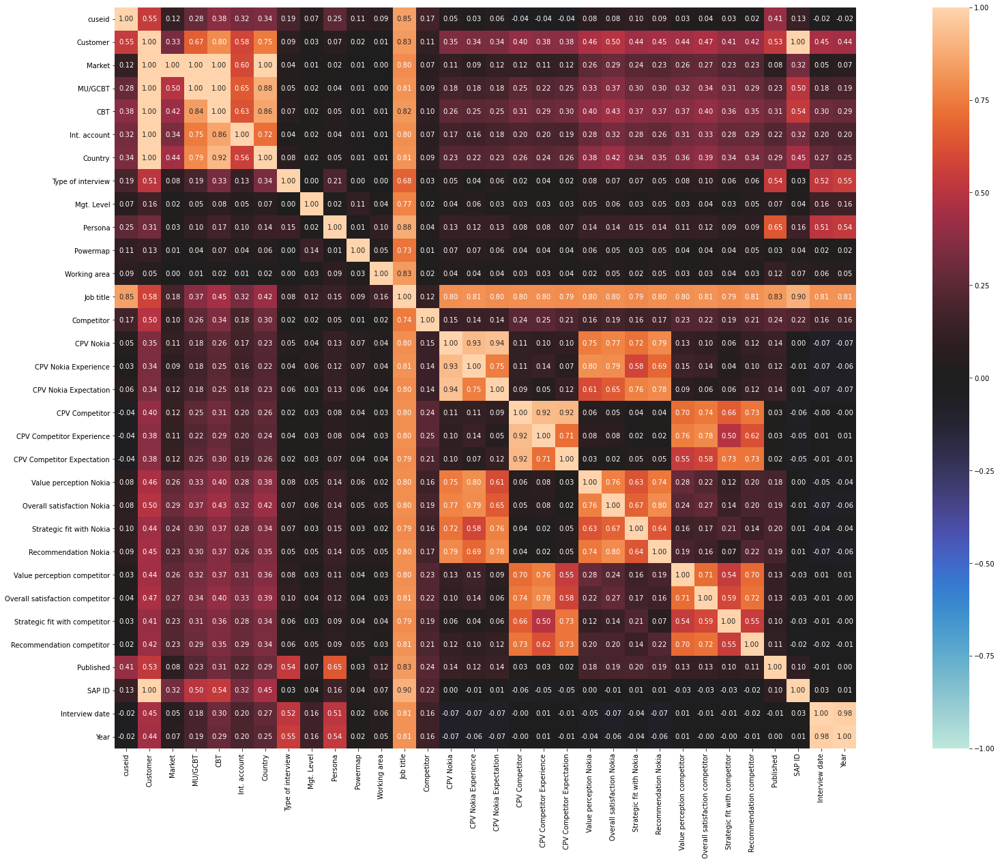

{'corr':                                    cuseid  Customer    Market   MU/GCBT  \
 cuseid                           1.000000  0.545969  0.122135  0.284572   
 Customer                         0.545969  1.000000  0.332221  0.666121   
 Market                           0.122135  1.000000  1.000000  1.000000   
 MU/GCBT                          0.284572  1.000000  0.498740  1.000000   
 CBT                              0.380151  1.000000  0.417618  0.837346   
 Int. account                     0.324558  1.000000  0.343087  0.746660   
 Country                          0.336245  1.000000  0.444281  0.788398   
 Type of interview                0.192767  0.514730  0.081313  0.193312   
 Mgt. Level                       0.072163  0.156361  0.015376  0.050443   
 Persona                          0.250575  0.306154  0.029260  0.103587   
 Powermap                         0.108162  0.126765  0.013052  0.036248   
 Working area                     0.086310  0.050561  0.002140  0.011042   
 Job

In [26]:
associations(CPVi, nom_nom_assoc='theil', figsize=(40, 20), cmap=None, cbar=True)

In [27]:
CPVi_categorical.columns

Index(['Customer', 'Market', 'MU/GCBT', 'CBT', 'Int. account', 'Country',
       'Type of interview', 'Mgt. Level', 'Persona', 'Powermap',
       'Working area', 'Job title', 'Competitor'],
      dtype='object')

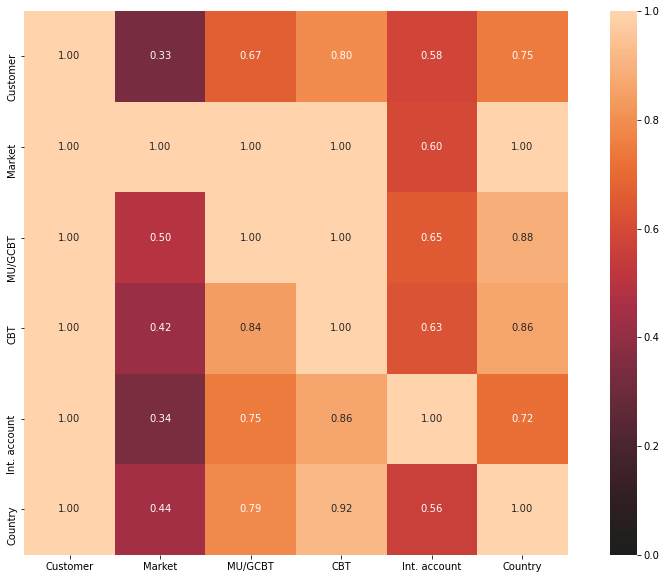

{'corr':               Customer    Market   MU/GCBT       CBT  Int. account   Country
 Customer           1.0  0.332221  0.666121  0.795514      0.581956  0.745935
 Market             1.0  1.000000  1.000000  1.000000      0.600991  0.997544
 MU/GCBT            1.0  0.498740  1.000000  1.000000      0.652319  0.882864
 CBT                1.0  0.417618  0.837346  1.000000      0.629159  0.862648
 Int. account       1.0  0.343087  0.746660  0.860039      1.000000  0.716429
 Country            1.0  0.444281  0.788398  0.919984      0.558936  1.000000,
 'ax': <AxesSubplot:>}

In [28]:
associations(CPVi[['Customer', 'Market', 'MU/GCBT', 'CBT', 'Int. account', 'Country']], nom_nom_assoc='theil', figsize=(15, 10), cmap=None, cbar=True,)

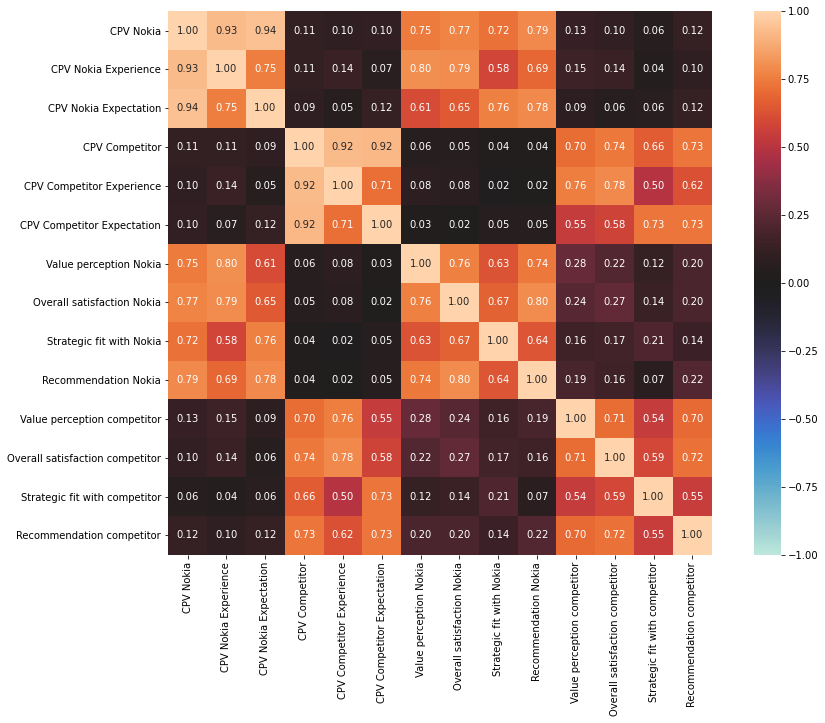

{'corr':                                  CPV Nokia  CPV Nokia Experience  \
 CPV Nokia                         1.000000              0.928449   
 CPV Nokia Experience              0.928449              1.000000   
 CPV Nokia Expectation             0.944218              0.754327   
 CPV Competitor                    0.110174              0.112911   
 CPV Competitor Experience         0.099704              0.139231   
 CPV Competitor Expectation        0.101706              0.069179   
 Value perception Nokia            0.745152              0.799876   
 Overall satisfaction Nokia        0.766182              0.793440   
 Strategic fit with Nokia          0.721872              0.581742   
 Recommendation Nokia              0.788797              0.690745   
 Value perception competitor       0.126117              0.154861   
 Overall satisfaction competitor   0.102770              0.137381   
 Strategic fit with competitor     0.056364              0.039825   
 Recommendation competitor

In [29]:
associations(CPVi[['CPV Nokia', 'CPV Nokia Experience', 'CPV Nokia Expectation',
       'CPV Competitor', 'CPV Competitor Experience',
       'CPV Competitor Expectation', 'Value perception Nokia',
       'Overall satisfaction Nokia', 'Strategic fit with Nokia',
       'Recommendation Nokia', 'Value perception competitor',
       'Overall satisfaction competitor', 'Strategic fit with competitor',
       'Recommendation competitor']], nom_nom_assoc='pearson', figsize=(15, 10), cmap=None, cbar=True)

## 7. DATA VISUALIZATION - DISTRIBUTION / HISTOGRAM

In [30]:
CPVi_numerical.columns

Index(['cuseid', 'CPV Nokia', 'CPV Nokia Experience', 'CPV Nokia Expectation',
       'CPV Competitor', 'CPV Competitor Experience',
       'CPV Competitor Expectation', 'Value perception Nokia',
       'Overall satisfaction Nokia', 'Strategic fit with Nokia',
       'Recommendation Nokia', 'Value perception competitor',
       'Overall satisfaction competitor', 'Strategic fit with competitor',
       'Recommendation competitor', 'Published', 'SAP ID', 'Interview date',
       'Year'],
      dtype='object')

In [31]:
len(CPVi_numerical.columns)

19

C:\Users\hancu\Anaconda3\envs\CiprianEnv\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\hancu\Anaconda3\envs\CiprianEnv\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\hancu\Anaconda3\envs\CiprianEnv\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with

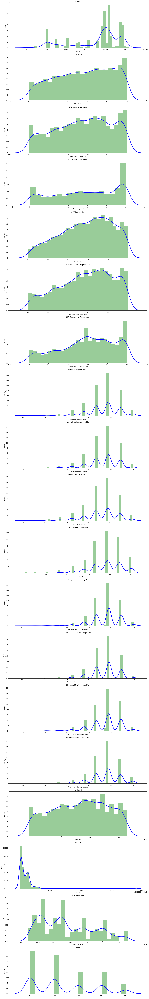

In [32]:
plt.figure(figsize=(15,100))
for i in range(len(CPVi_numerical.columns)):
  plt.subplot(19, 1, i+1)
  sns.distplot(CPVi_numerical[CPVi_numerical.columns[i]], kde_kws={"color": "b", "lw": 3, "label": "KDE"}, hist_kws={"color": "g"})
  plt.title(CPVi_numerical.columns[i])

plt.tight_layout()

C:\Users\hancu\Anaconda3\envs\CiprianEnv\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


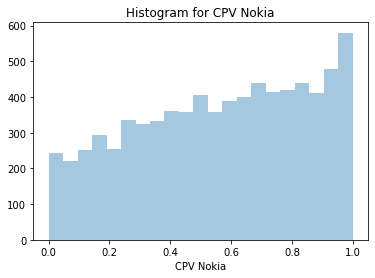

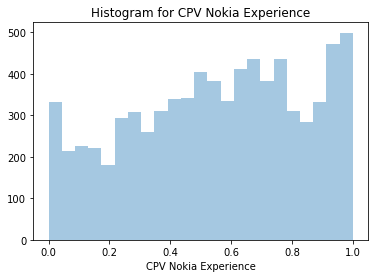

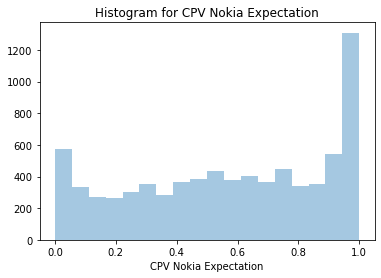

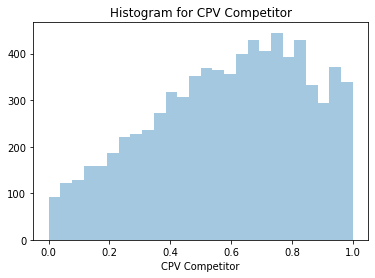

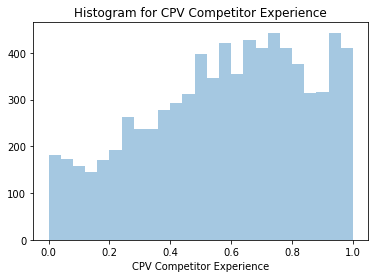

...

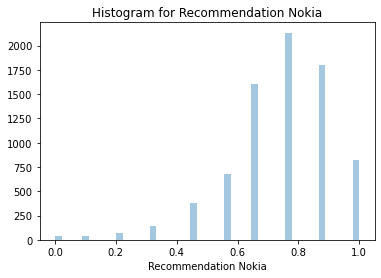

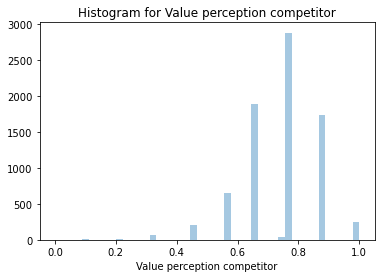

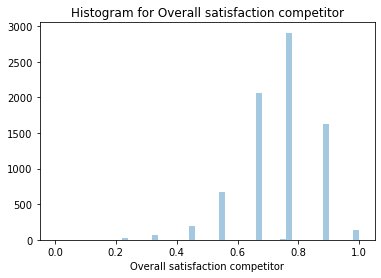

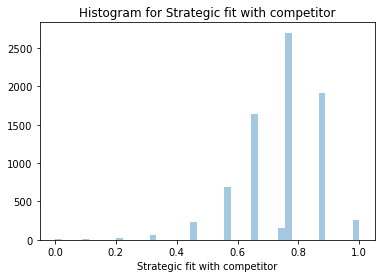

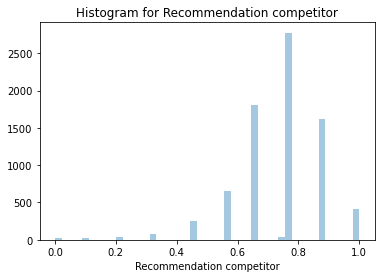

In [33]:
# Plot histogram for each continuous feature to see if a transformation is necessary
for feature in ['CPV Nokia', 'CPV Nokia Experience', 'CPV Nokia Expectation',
       'CPV Competitor', 'CPV Competitor Experience',
       'CPV Competitor Expectation', 'Value perception Nokia',
       'Overall satisfaction Nokia', 'Strategic fit with Nokia',
       'Recommendation Nokia', 'Value perception competitor',
       'Overall satisfaction competitor', 'Strategic fit with competitor',
       'Recommendation competitor']:
    sns.distplot(CPVi[feature], kde=False)
    plt.title('Histogram for {}'.format(feature))
    plt.show()

## 8. DATA VISUALIZATION - BOXPLOTS

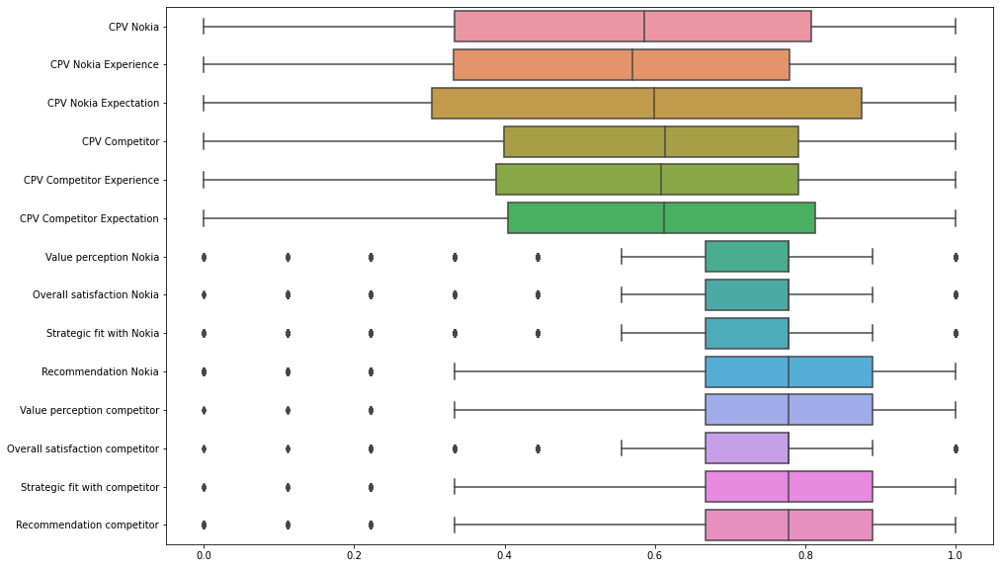

In [34]:
plt.figure(figsize=(15,10))
sns.boxplot( data = CPVi[['CPV Nokia', 'CPV Nokia Experience', 'CPV Nokia Expectation',
       'CPV Competitor', 'CPV Competitor Experience',
       'CPV Competitor Expectation', 'Value perception Nokia',
       'Overall satisfaction Nokia', 'Strategic fit with Nokia',
       'Recommendation Nokia', 'Value perception competitor',
       'Overall satisfaction competitor', 'Strategic fit with competitor',
       'Recommendation competitor']], orient="h")
plt.show()

In [35]:
y0 = CPVi['CPV Nokia']
y1 = CPVi['CPV Nokia Experience']
y2 = CPVi['CPV Nokia Expectation']
y3 = CPVi['CPV Competitor']
y4 = CPVi['CPV Competitor Experience']
y5 = CPVi['CPV Competitor Expectation']
y6 = CPVi['Value perception Nokia']
y7 = CPVi['Overall satisfaction Nokia']
y8 = CPVi['Strategic fit with Nokia']
y9 = CPVi['Recommendation Nokia']
y10 = CPVi['Value perception competitor']
y11 = CPVi['Overall satisfaction competitor']
y12 = CPVi['Strategic fit with competitor']
y13 = CPVi['Recommendation competitor']
fig = go.Figure()
fig.add_trace(go.Box(x=y0, quartilemethod="linear", name='CPV Nokia'))
fig.add_trace(go.Box(x=y1, quartilemethod="linear", name='CPV Nokia Experience'))
fig.add_trace(go.Box(x=y2, quartilemethod="linear", name='CPV Nokia Expectation'))
fig.add_trace(go.Box(x=y3, quartilemethod="linear", name='CPV Competitor'))
fig.add_trace(go.Box(x=y4, quartilemethod="linear", name='CPV Competitor Experience'))
fig.add_trace(go.Box(x=y5, quartilemethod="linear", name='CPV Competitor Expectation'))
fig.add_trace(go.Box(x=y6, quartilemethod="linear", name='Value perception Nokia'))
fig.add_trace(go.Box(x=y7, quartilemethod="linear", name='Overall satisfaction Nokia'))
fig.add_trace(go.Box(x=y8, quartilemethod="linear", name='Strategic fit with Nokia'))
fig.add_trace(go.Box(x=y9, quartilemethod="linear", name='Recommendation Nokia'))
fig.add_trace(go.Box(x=y10, quartilemethod="linear", name='Value perception competitor'))
fig.add_trace(go.Box(x=y11, quartilemethod="linear", name='Overall satisfaction competitor'))
fig.add_trace(go.Box(x=y12, quartilemethod="linear", name='Strategic fit with competitor'))
fig.add_trace(go.Box(x=y13, quartilemethod="linear", name='Recommendation competitor'))
fig.update_layout(title_text="Box Plot All Scores")
fig.show()

## 9. DATA VISUALIZATION - Plot columns in pairs

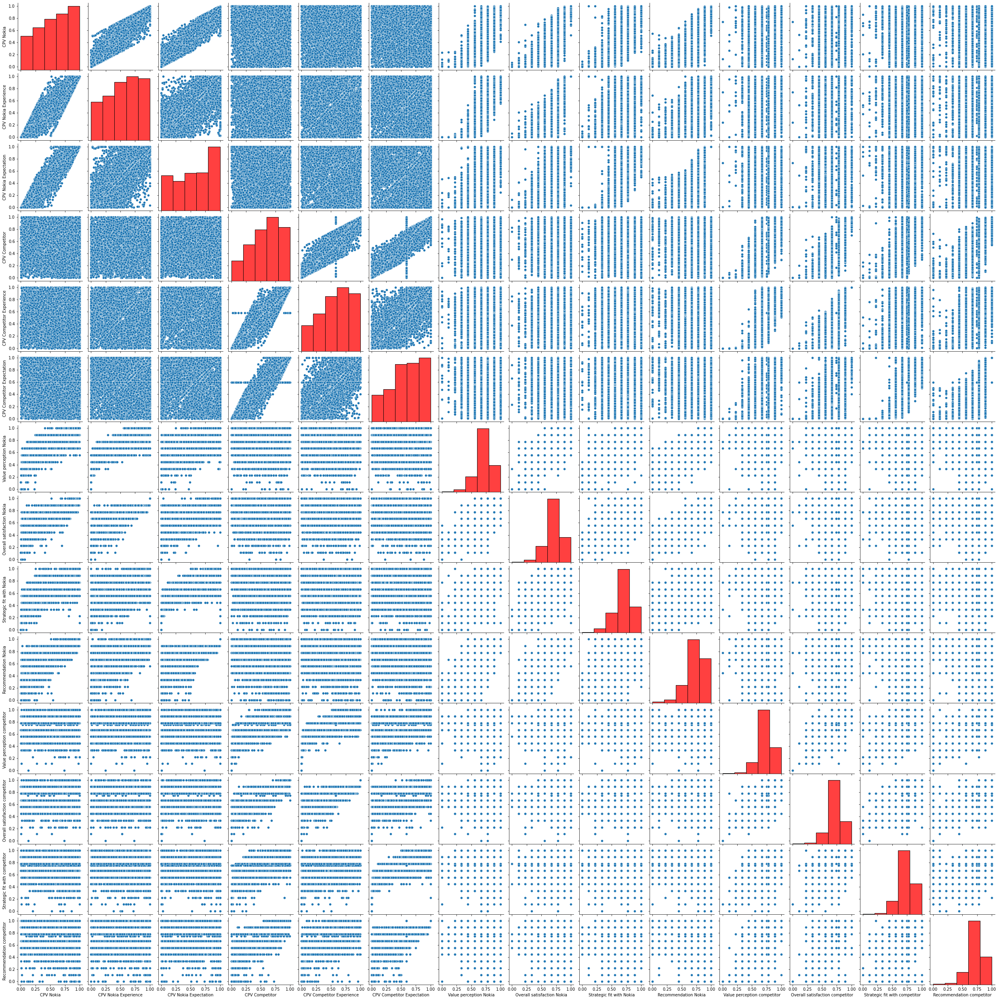

In [36]:
import seaborn as sns
sns.pairplot(CPVi[['CPV Nokia', 'CPV Nokia Experience', 'CPV Nokia Expectation',
       'CPV Competitor', 'CPV Competitor Experience',
       'CPV Competitor Expectation', 'Value perception Nokia',
       'Overall satisfaction Nokia', 'Strategic fit with Nokia',
       'Recommendation Nokia', 'Value perception competitor',
       'Overall satisfaction competitor', 'Strategic fit with competitor',
       'Recommendation competitor']], diag_kws={'color':'red', 'bins':5})

Text(0, 0.5, 'CPV Nokia Experience')

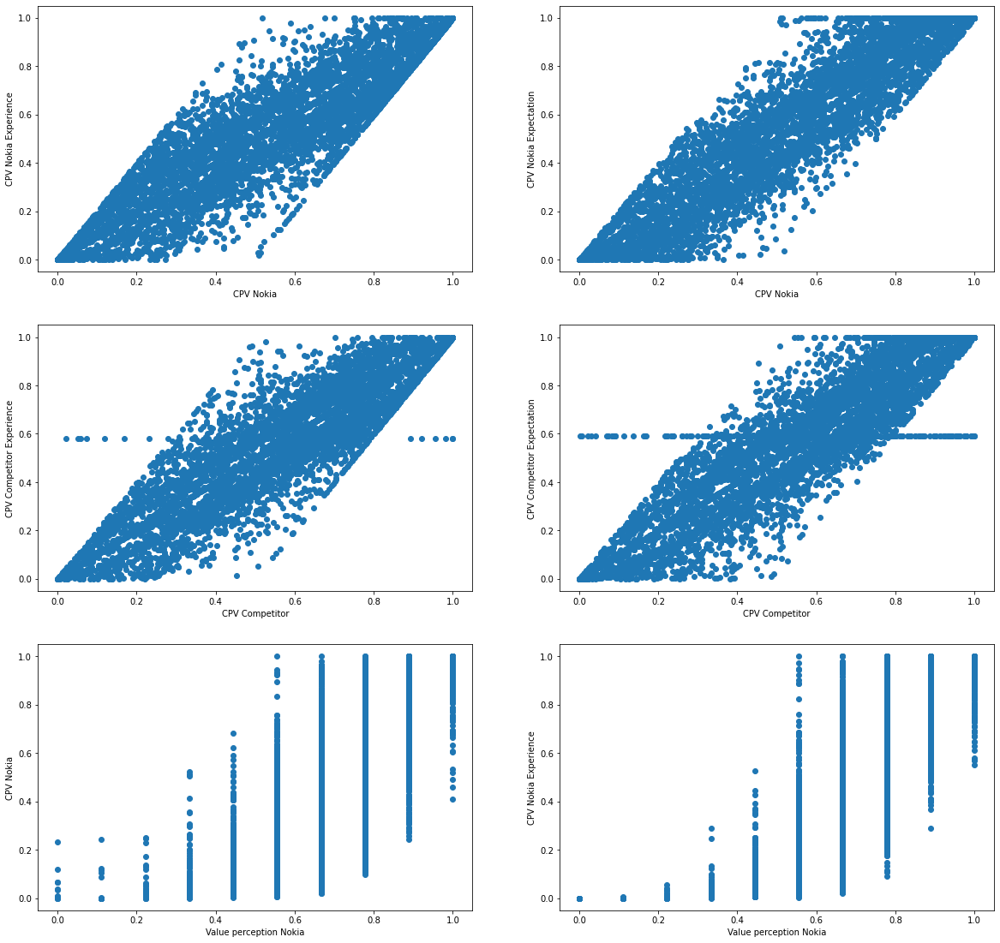

In [37]:
plt.figure(figsize=(20,40))

x1 = CPVi['CPV Nokia']
y1 = CPVi['CPV Nokia Experience']
plt.subplot(6,2,1)
plt.scatter(x1, y1)
plt.xlabel('CPV Nokia')
plt.ylabel('CPV Nokia Experience')

x2 = CPVi['CPV Nokia']
y2 = CPVi['CPV Nokia Expectation']
plt.subplot(6,2,2)
plt.scatter(x2, y2)
plt.xlabel('CPV Nokia')
plt.ylabel('CPV Nokia Expectation')

x3 = CPVi['CPV Competitor']
y3 = CPVi['CPV Competitor Experience']
plt.subplot(6,2,3)
plt.scatter(x3, y3)
plt.xlabel('CPV Competitor')
plt.ylabel('CPV Competitor Experience')

x4 = CPVi['CPV Competitor']
y4 = CPVi['CPV Competitor Expectation']
plt.subplot(6,2,4)
plt.scatter(x4, y4)
plt.xlabel('CPV Competitor')
plt.ylabel('CPV Competitor Expectation')

x5 = CPVi['Value perception Nokia']
y5 = CPVi['CPV Nokia']
plt.subplot(6,2,5)
plt.scatter(x5, y5)
plt.xlabel('Value perception Nokia')
plt.ylabel('CPV Nokia')

x6 = CPVi['Value perception Nokia']
y6 = CPVi['CPV Nokia Experience']
plt.subplot(6,2,6)
plt.scatter(x6, y6)
plt.xlabel('Value perception Nokia')
plt.ylabel('CPV Nokia Experience')

## 10. OUTLIER DETECTION & OUTLIER TREATMENT USING 1.5 IQR (1.5 INTER-QUARTILE RANGE)

### 10.1 Outliers detection for the column: 'Recommendation Nokia'

In [38]:
CPVi.sort_values('Recommendation Nokia', ascending=True, inplace=True, ignore_index = True)

In [39]:
def outlier_treatment(datacolumn):
    sorted(datacolumn)
    Q1,Q3 = np.percentile(datacolumn , [25,75])
    IQR = Q3 - Q1
    lower_range = Q1 - (1.5 * IQR)
    upper_range = Q3 + (1.5 * IQR)
    return lower_range,upper_range

In [40]:
lowerbound,upperbound = outlier_treatment(CPVi['Recommendation Nokia'])
print('lower_range: ' + str(lowerbound))
print('upper_range: ' + str(upperbound))

lower_range: 0.33333333333333304
upper_range: 1.2222222222222223


In [41]:
CPVi['Recommendation Nokia'][(CPVi['Recommendation Nokia'] < lowerbound)]

0      0.000000
1      0.000000
2      0.000000
3      0.000000
4      0.000000
5      0.000000
6      0.000000
7      0.000000
8      0.000000
9      0.000000
10     0.000000
11     0.000000
12     0.000000
13     0.000000
14     0.000000
15     0.000000
16     0.000000
17     0.000000
18     0.000000
19     0.000000
20     0.000000
21     0.000000
22     0.000000
23     0.000000
24     0.000000
25     0.000000
26     0.000000
27     0.000000
28     0.000000
29     0.000000
30     0.000000
31     0.000000
32     0.000000
33     0.000000
34     0.000000
35     0.000000
36     0.000000
37     0.000000
38     0.111111
39     0.111111
40     0.111111
41     0.111111
42     0.111111
43     0.111111
44     0.111111
45     0.111111
46     0.111111
47     0.111111
48     0.111111
49     0.111111
50     0.111111
51     0.111111
52     0.111111
53     0.111111
54     0.111111
55     0.111111
56     0.111111
57     0.111111
58     0.111111
59     0.111111
60     0.111111
61     0.111111
62     0

In [42]:
CPVi_LowScore = CPVi.head(152)
CPVi_LowScore

,cuseid,Customer,Market,MU/GCBT,CBT,Int. account,Country,Type of interview,Mgt. Level,Persona,Powermap,Working area,Job title,Competitor,CPV Nokia,CPV Nokia Experience,CPV Nokia Expectation,CPV Competitor,CPV Competitor Experience,CPV Competitor Expectation,Value perception Nokia,Overall satisfaction Nokia,Strategic fit with Nokia,Recommendation Nokia,Value perception competitor,Overall satisfaction competitor,Strategic fit with competitor,Recommendation competitor,Published,SAP ID,Interview date,Year
0,76090,Turk Telekom,EUR,EUR CECA,EUR CECA CBT Turkey,Turk Telekom,Turkey,Face to Face,Level 4,n.a.,Decision Maker,Technical design & Implementation,Deputy Head of Networks,Alcatel-Lucent,0.0049,0.0009,0.0089,0.2141,0.1401,0.2882,0.222222,0.333333,0.333333,0.000000,0.555556,0.555556,0.666667,0.555556,2010-11-12,301003015,2021-11-11,2021
1,95734,everything everywhere,EUR,EUR UI,EUR UI CBT BT,British Telecom,United Kingdom,Phone 2,Level 3,n.a.,Decision Maker,"Operations, Managed Services & Maintenance","Programme Director, Strategic Programmes",Huawei,0.0000,0.0000,0.0000,0.8086,0.6866,0.9305,0.111111,0.111111,0.000000,0.000000,0.777778,0.777778,0.777778,0.888889,2017-10-16,301003825,2017-09-27,2017
2,76861,UScellular,NAM,NAM US MA,NAM US MA CBT,n.a.,United States,Face to Face,Level 3,n.a.,Influencer,"Operations, Managed Services & Maintenance","Sr. Director, National Network Operations",Ericsson,0.2693,0.4096,0.1290,0.6661,0.6661,0.6661,0.666667,0.333333,0.444444,0.000000,0.666667,0.666667,0.666667,0.666667,2015-10-05,301002265,2017-09-21,2017
3,76836,Shaw Communications,NAM,NAM CA,NAM CA CBT,n.a.,Canada,Phone 2,Level 4,n.a.,Influencer,Technical design & Implementation,"Manager, Telephony Infrastructure Systems",GENBAND,0.0930,0.0973,0.0887,0.8375,0.8375,0.8375,0.333333,0.333333,0.333333,0.000000,0.777778,0.777778,0.777778,0.777778,2011-06-02,301002290,2020-05-30,2020
4,83393,BT,EUR,EUR UI,EUR UI CBT BT,British Telecom,United Kingdom,Face to Face,Level 2,n.a.,Decision Maker,Technical design & Implementation,Chief Architect Officer,Alcatel-Lucent,0.0360,0.0000,0.0721,0.9667,0.9334,1.0000,0.000000,0.333333,0.333333,0.000000,0.888889,0.888889,0.888889,1.000000,2015-06-10,301001020,2017-05-14,2017
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147,78391,Sky Brasil,LAT,LAT BRA,LAT BRA CBT,n.a.,Brazil,Face to Face,Level 3,n.a.,Influencer,Technical design & Implementation,"Sr. Director RF Engineering, DirecTV Latam",Huawei,0.2971,0.4268,0.1673,0.8055,0.8525,0.7586,0.444444,0.555556,0.333333,0.222222,0.666667,0.777778,0.777778,0.666667,2014-10-02,301004622,2018-09-04,2018
148,76680,SFR,EUR,EUR WCE,EUR WCE CBT SFR,Altice,France,Phone 2,Level 3,n.a.,Influencer,Technical design & Implementation,"Operations Director, Mobile Access",Huawei,0.0314,0.0541,0.0087,0.5468,0.5468,0.5468,0.444444,0.333333,0.333333,0.222222,0.666667,0.666667,0.666667,0.666667,2014-04-14,301000834,2018-04-07,2018
149,21519,Optus,APJ,APJ OCE,APJ OCE CBT Australia,SingTel,Australia,Phone 2,Level 3,n.a.,Ultimate Decision Maker,Company & Product Strategy,VP Converged Services Engineering,Cisco,0.0211,0.0221,0.0201,0.8334,0.6804,0.9864,0.333333,0.444444,0.333333,0.222222,0.777778,0.666667,0.777778,0.888889,2013-11-06,301002140,2018-10-29,2018
150,78592,SMART / PLDT,APJ,APJ SEA,APJ SEA CBT Philippines,PLDT,Philippines,Face to Face,Level 3,n.a.,Influencer,Technical design & Implementation,Department Head of Transmission,Huawei,0.1551,0.2819,0.0282,0.6100,0.6114,0.6086,0.666667,0.444444,0.444444,0.222222,0.888889,0.666667,0.666667,0.777778,2016-11-10,301002172,2017-11-04,2017


### 10.2 List of Customers who rated a lower score than entire population

In [43]:
CPVi_LowScore['Customer'].unique()

array(['Turk Telekom', 'everything everywhere', 'UScellular',
       'Shaw Communications', 'BT', 'Sky Brasil', 'Telefonica Panama',
       'SFR', 'Orange Poland', 'Orange France', 'Vodacom Tanzania',
       'STC Saudi', 'Telenor Sweden', 'TELUS', 'MegaFon',
       'Deutsche Telekom AG', 'Claro Colombia', 'Mobily', 'StarHub',
       'Optus', 'Vodafone Ukraine', 'Tigo Colombia', 'Vodafone UK',
       'Telenor Denmark', 'Claro Ecuador', 'T-Mobile Polska',
       'Nextel Brazil', 'Zain Saudi Arabia', 'Claro Brasil',
       'T-Mobile Czech/Slovak Telekom', 'Charter', 'Zain Kuwait',
       'Telkom', 'T-Mobile Austria', 'Proximus', 'Maxis Malaysia', 'du',
       'Celcom', 'Swisscom', 'Zain Iraq', 'TeliaSonera Finland', 'LG U+',
       'Korea Telecom', 'Oi Brasil', 'T-Mobile Netherlands', 'BuyIn',
       'CTC Jiangsu', 'Telefonica Ecuador', 'Telmex Mexico', 'SK Telecom',
       'Orange HQ', 'Vodacom RSA', '3 Ireland', 'NuevaTel', 'KDDI', 'AIS',
       'Telefonica Corporate', 'H3I', 'Ooredoo H

### 10.3 Outliers detection using 3 alternative solutions:
- data points that lie anywhere between 5% and 95% percentile of the dataset
- 3 standard deviations below/above the mean
- data points that lie anywhere between 1% and 99% percentile of the datasete

In [44]:
def detect_outlier(feature):
    outliers = []
    data = CPVi[feature]
    mean = np.mean(data)
    std =np.std(data)
    
    
    for y in data:
        z_score= (y - mean)/std
        if np.abs(z_score) > 3:
            outliers.append(y)
    print('\nOutlier low for {}:'.format(feature))
    print('  --95p: {:.1f} / {} values exceed that'.format(data.quantile(.05),
                                                             len([i for i in data
                                                                  if i < data.quantile(.05)])))
    print('  --3sd: {:.1f} / {} values exceed that'.format(mean - 3*(std), len(outliers)))
    print('  --99p: {:.1f} / {} values exceed that'.format(data.quantile(.01),
                                                             len([i for i in data
                                                                  if i < data.quantile(.01)])))

In [45]:
for feat in ['Recommendation Nokia']:
    detect_outlier(feat)


Outlier low for Recommendation Nokia:
  --95p: 0.4 / 289 values exceed that
  --3sd: 0.2 / 82 values exceed that
  --99p: 0.1 / 38 values exceed that


In [46]:
CPVi_numerical.columns

Index(['cuseid', 'CPV Nokia', 'CPV Nokia Experience', 'CPV Nokia Expectation',
       'CPV Competitor', 'CPV Competitor Experience',
       'CPV Competitor Expectation', 'Value perception Nokia',
       'Overall satisfaction Nokia', 'Strategic fit with Nokia',
       'Recommendation Nokia', 'Value perception competitor',
       'Overall satisfaction competitor', 'Strategic fit with competitor',
       'Recommendation competitor', 'Published', 'SAP ID', 'Interview date',
       'Year'],
      dtype='object')

## 11. COMBINE COLUMNS / FEATURES

### 11.1 Average Score Nokia

In [47]:
CPVi['AVG Score Nokia'] = CPVi[['CPV Nokia', 'CPV Nokia Experience', 'CPV Nokia Expectation','Value perception Nokia',
                           'Overall satisfaction Nokia', 'Strategic fit with Nokia','Recommendation Nokia']].mean(axis=1)

### 11.2 Average Score Competitor

In [48]:
CPVi['AVG Score Competitor'] = CPVi[['CPV Competitor', 'CPV Competitor Experience','CPV Competitor Expectation', 
'Value perception competitor','Overall satisfaction competitor', 'Strategic fit with competitor','Recommendation competitor']].mean(axis=1)

In [49]:
CPVi.sample(10)

,cuseid,Customer,Market,MU/GCBT,CBT,Int. account,Country,Type of interview,Mgt. Level,Persona,Powermap,Working area,Job title,Competitor,CPV Nokia,CPV Nokia Experience,CPV Nokia Expectation,CPV Competitor,CPV Competitor Experience,CPV Competitor Expectation,Value perception Nokia,Overall satisfaction Nokia,Strategic fit with Nokia,Recommendation Nokia,Value perception competitor,Overall satisfaction competitor,Strategic fit with competitor,Recommendation competitor,Published,SAP ID,Interview date,Year,AVG Score Nokia,AVG Score Competitor
656,83210,3 Ireland,EUR,EUR UI,EUR UI CBT Ireland,Hutchison,Ireland,Phone 2,Level 3,n.a.,Decision Maker,Finance & Procurement,Head of Procurement,Ericsson,0.3956,0.3562,0.4350,0.7129,0.9075,0.518200,0.555556,0.555556,0.666667,0.444444,0.777778,0.777778,0.555556,0.666667,2016-10-19,301001019,2017-09-19,2017,0.487003,0.702340
3283,21701,3 UK,EUR,EUR UI,EUR UI CBT Hutchison,Hutchison,United Kingdom,Phone 2,Level 3,n.a.,Influencer,"Operations, Managed Services & Maintenance",Service Quality Platforms,Huawei,0.5740,0.6110,0.5371,0.8132,0.8132,0.592446,0.777778,0.666667,0.555556,0.777778,0.888889,0.777778,0.751796,0.888889,2011-11-01,301001018,2020-10-31,2020,0.642840,0.789457
4685,80878,T-Hrvatski Telekom,EUR,EUR DT,EUR DT CBT CENTRAL,DT,Croatia,Phone 2,Level 2,COO - VP Mobile Operations,Decision Maker,"Operations, Managed Services & Maintenance",Head of Core Network Planning & Operation Department,Ericsson,0.7110,0.7110,0.7110,0.7698,0.8286,0.711000,0.666667,0.777778,0.666667,0.777778,0.777778,0.777778,0.666667,0.777778,2018-04-16,301000725,2018-03-15,2018,0.717413,0.758486
5427,22112,Tigo Colombia,LAT,LAT NORTHERN CONE,LAT NORTHERN CONE CBT,Millicom (Tigo),Colombia,Face to Face,Level 3,n.a.,Influencer,"Operations, Managed Services & Maintenance","Regional Network Director, Center",Huawei,0.8330,0.7203,0.9457,0.9522,0.9457,0.958600,0.777778,0.777778,0.777778,0.888889,0.777778,0.888889,0.888889,0.888889,2013-08-08,301000364,2018-07-16,2018,0.817317,0.900135
2533,78569,Orange Slovakia,EUR,EUR OR,EUR OR CBT Europe East,Orange,Slovakia,Phone 2,Level 3,n.a.,Decision Maker,Technical design & Implementation,Head of Data Networks,Cisco,0.2748,0.3773,0.1722,1.0000,1.0000,1.000000,0.666667,0.666667,0.555556,0.666667,1.000000,1.000000,1.000000,1.000000,2013-07-01,301000639,2018-05-28,2018,0.482837,1.000000
1357,78782,LG U+,APJ,APJ KOR,APJ KOR CBT,n.a.,"Korea, Republic of",Face to Face,Level 4,n.a.,Influencer,Finance & Procurement,"Manager, Purchasing",Samsung,0.1849,0.1580,0.2117,0.7545,0.7545,0.754500,0.555556,0.555556,0.555556,0.666667,0.777778,0.777778,0.777778,0.777778,2013-09-09,301003334,2018-09-03,2018,0.412562,0.767802
3907,78449,Telefonica Chile,LAT,LAT SOUTHERN CONE,LAT SOUTHERN CONE CBT,Telefonica,Chile,Face to Face,Level 4,n.a.,Influencer,Technical design & Implementation,Implementation Assistant Manager,Huawei,0.6247,0.7418,0.5076,0.6644,0.7418,0.587100,0.888889,0.777778,0.666667,0.777778,0.888889,0.777778,0.888889,0.666667,2014-04-08,301000408,2018-03-25,2018,0.712173,0.745075
758,76534,Orange HQ,EUR,EUR OR,EUR OR CBT France,Orange,France,Face to Face,Level 2,n.a.,Influencer,"Operations, Managed Services & Maintenance",Head of Operations,Ericsson,0.3749,0.5506,0.1993,0.8309,0.8181,0.843600,0.888889,0.555556,0.555556,0.555556,0.777778,0.777778,0.888889,0.777778,2012-11-23,301001402,2019-11-06,2019,0.525765,0.816403
4742,62336,Telefonica Colombia,LAT,LAT NORTHERN CONE,LAT NORTHERN CONE CBT,Telefonica,Colombia,Face to Face,Level 3,n.a.,Decision Maker,Technical design & Implementation,"RAN Engineering, Network Quality & Management Director",Huawei,0.5426,0.5426,0.5426,0.2926,0.3998,0.185400,0.777778,0.777778,0.777778,0.777778,0.777778,0.666667,0.666667,0.666667,2016-11-04,301000420,2017-09-16,2017,0.676987,0.522225
397,78718,T-Mobile Austria,EUR,EUR DT,EUR DT CBT CENTRAL,DT,Austria,Face to Face,Level 4,n.a.,Decision Maker,Finance & Procurement,Sr. Manager Procurement,Huawei,0.0773,0.1142,0.0404,0.4

### 11.3 Scatterplot between: 'AVG Score Nokia' vs 'AVG Score Competitor'

<AxesSubplot:xlabel='AVG Score Nokia', ylabel='AVG Score Competitor'>

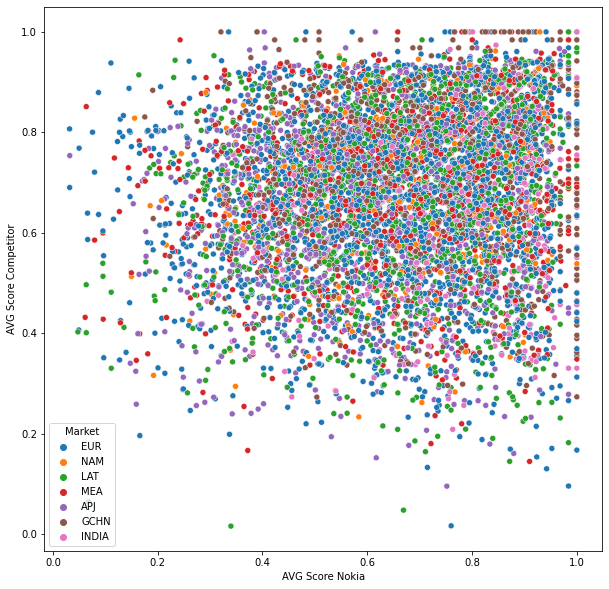

In [50]:
plt.figure(figsize=(10,10))
sns.scatterplot(x='AVG Score Nokia', y='AVG Score Competitor', hue = 'Market', data = CPVi)

### 11.4 Scatterplot between: 'AVG Score Nokia' vs 'AVG Score Competitor'

<AxesSubplot:>

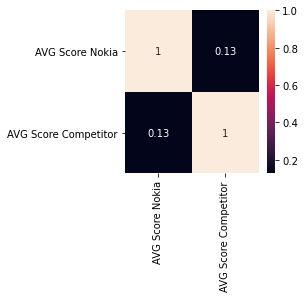

In [51]:
plt.figure(figsize=(3,3))
sns.heatmap(CPVi[['AVG Score Nokia', 'AVG Score Competitor']].corr(), annot=True)

### 11.5 Statistics comparison between: 'AVG Score Nokia' vs 'AVG Score Competitor'

In [52]:
print('AVG Score Nokia: ')
print(CPVi['AVG Score Nokia'].describe())
print("")
print('AVG Score Competitor: ')
print(CPVi['AVG Score Competitor'].describe())

AVG Score Nokia: 
count    7708.000000
mean        0.658201
std         0.194521
min         0.031746
25%         0.518891
50%         0.678271
75%         0.813325
max         1.000000
Name: AVG Score Nokia, dtype: float64

AVG Score Competitor: 
count    7708.000000
mean        0.678001
std         0.165866
min         0.015873
25%         0.567333
50%         0.693492
75%         0.803193
max         1.000000
Name: AVG Score Competitor, dtype: float64


### 11.6 Statistics comparison by Market between: 'AVG Score Nokia' vs 'AVG Score Competitor'

In [53]:
print(CPVi.groupby('Market')[['AVG Score Nokia']].describe())
print(CPVi.groupby('Market')[['AVG Score Competitor']].describe())

       AVG Score Nokia                                                    \
                 count      mean       std       min       25%       50%   
Market                                                                     
APJ             1253.0  0.616040  0.186231  0.032160  0.476079  0.619240   
EUR             2558.0  0.648622  0.195086  0.031746  0.517587  0.671855   
GCHN             885.0  0.695806  0.193106  0.175359  0.537600  0.720903   
INDIA            315.0  0.761047  0.165811  0.294341  0.669391  0.800949   
LAT             1308.0  0.666405  0.194341  0.047619  0.532037  0.687364   
MEA             1045.0  0.665127  0.196627  0.061505  0.538163  0.693443   
NAM              344.0  0.639855  0.189053  0.149871  0.508929  0.654520   

                       
             75%  max  
Market                 
APJ     0.760387  1.0  
EUR     0.802243  1.0  
GCHN    0.854694  1.0  
INDIA   0.892014  1.0  
LAT     0.831119  1.0  
MEA     0.819417  1.0  
NAM     0.795401  1.0  

### 11.7 Visual comparison by some categorical columns ('Market', 'Mgt. Level', 'Powermap', 'Working area', 'Type of interview')

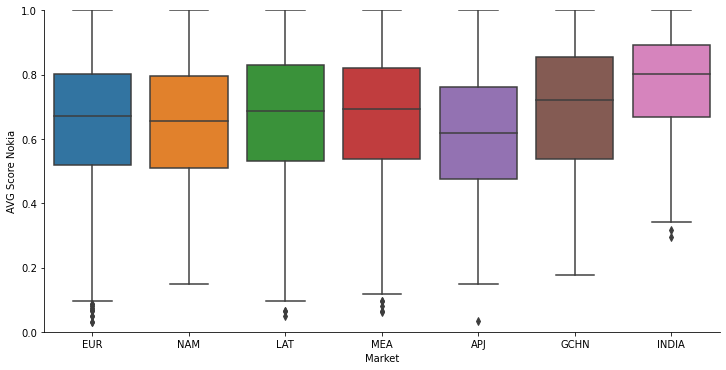

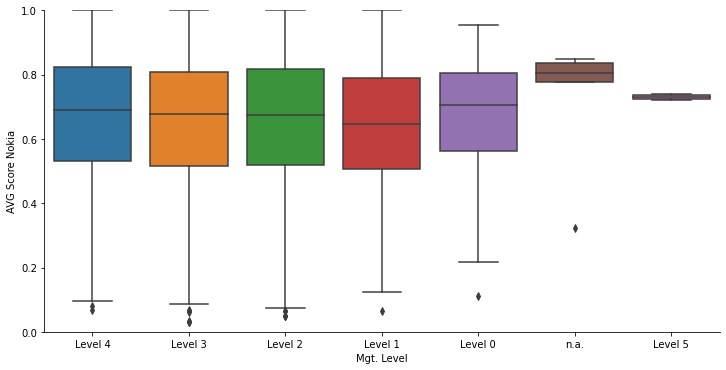

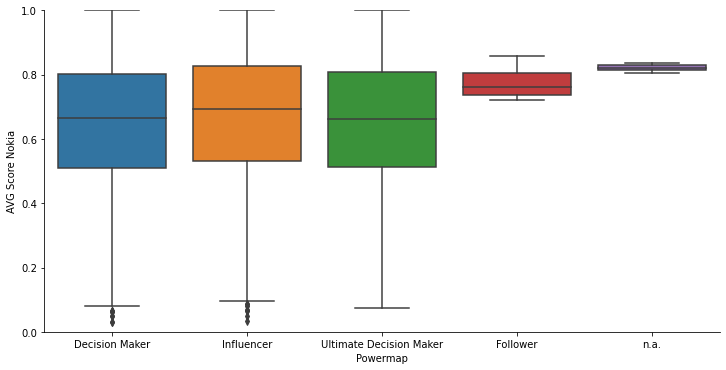

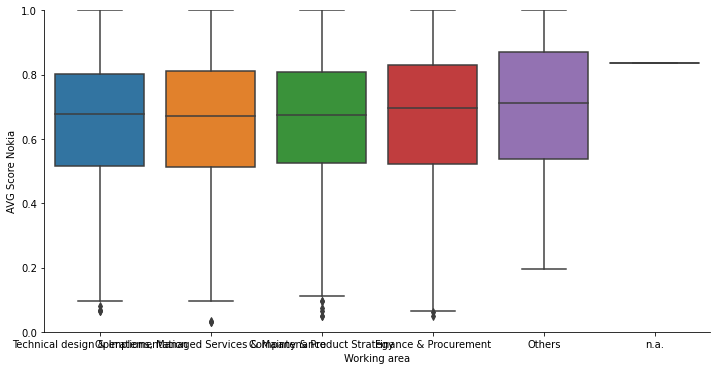

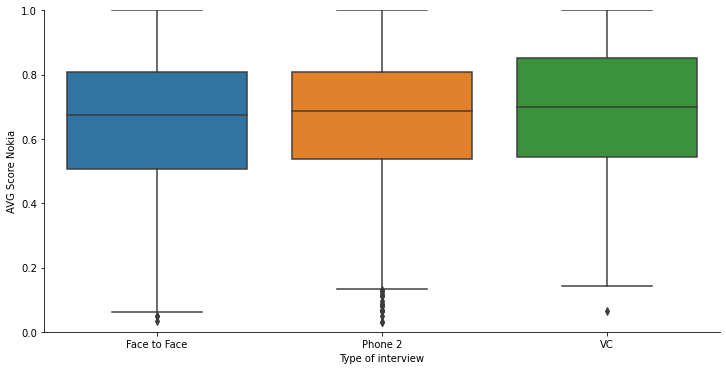

In [54]:
# Generate categorical plots for features
for col in ['Market', 'Mgt. Level', 'Powermap', 'Working area', 'Type of interview']:
    sns.catplot(x=col, y='AVG Score Nokia', data=CPVi, kind='box', aspect=2, )
    plt.ylim(0, 1)

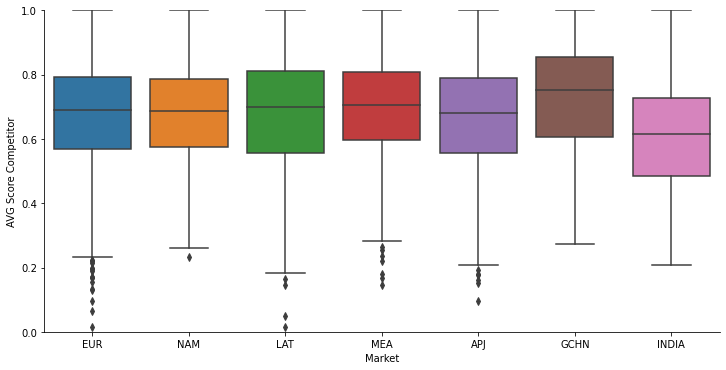

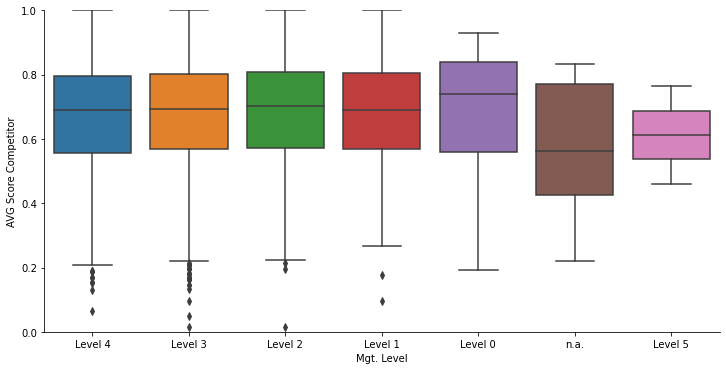

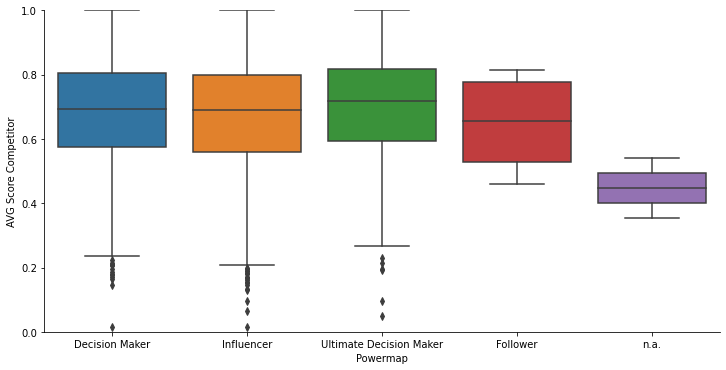

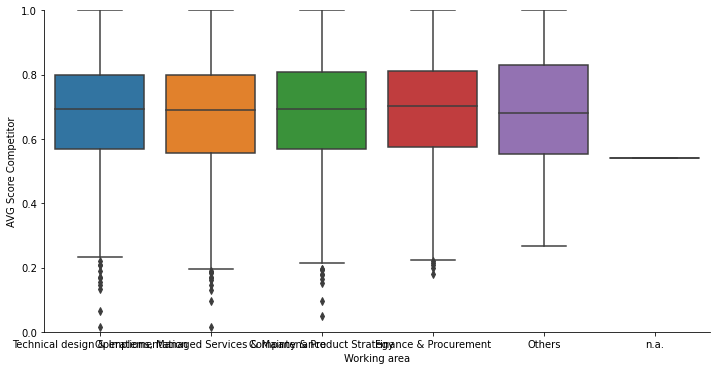

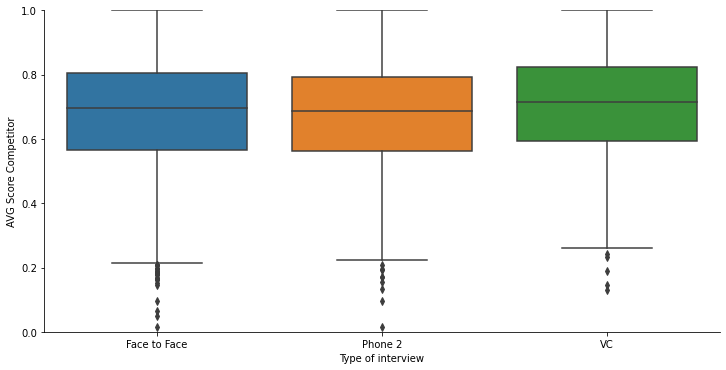

In [55]:
# Generate categorical plots for features
for col in ['Market', 'Mgt. Level', 'Powermap', 'Working area', 'Type of interview']:
    sns.catplot(x=col, y='AVG Score Competitor', data=CPVi, kind='box', aspect=2, )
    plt.ylim(0, 1)

## 12. Implement a ML Clustering Algorithm: KMeans & PCA (Principal Component Analysis)

### 12.1 Scalling data in order to get:
- Standard Deviation = 1
- Mean = 0

In [79]:
features_n=['CPV Nokia','CPV Nokia Experience', 'CPV Nokia Expectation', 'CPV Competitor', 'CPV Competitor Experience', 'CPV Competitor Expectation',
       'Value perception Nokia', 'Overall satisfaction Nokia','Strategic fit with Nokia', 'Recommendation Nokia',
       'Value perception competitor', 'Overall satisfaction competitor','Strategic fit with competitor', 'Recommendation competitor']

In [80]:
CPVi_scaled=CPVi[features_n].to_numpy()
print(CPVi_scaled.shape)
print('')
print(CPVi_scaled.round(2))

(7708, 14)

[[0.   0.   0.01 ... 0.56 0.67 0.56]
 [0.   0.   0.   ... 0.78 0.78 0.89]
 [0.27 0.41 0.13 ... 0.67 0.67 0.67]
 ...
 [0.87 0.73 1.   ... 0.78 0.67 0.78]
 [0.98 0.96 1.   ... 0.89 0.89 1.  ]
 [0.99 0.99 1.   ... 0.67 0.56 0.67]]


In [84]:
scaler = StandardScaler()
CPVi_scaled = scaler.fit_transform(CPVi_scaled)
print('Standard Deviation: '+ str(CPVi_scaled[:, 0].std()) )
print('Mean: '+ str(CPVi_scaled[:, 0].mean()))
print('Min: '+ str(CPVi_scaled.min()))
print('Max: '+ str(CPVi_scaled.max()))

Standard Deviation: 1.0
Mean: 0.0
Min: -5.964552307728343
Max: 2.0777206810818685


In [87]:
CPVi_scaled

array([[-1.97256668, -1.94189449, -1.76458963, ..., -1.49662287,
        -0.63327706, -1.29220854],
       [-1.98990271, -1.94506831, -1.79241428, ...,  0.29054891,
         0.19327927,  0.97790886],
       [-1.03712858, -0.50062454, -1.38911319, ..., -0.60303698,
        -0.63327706, -0.53550274],
       ...,
       [ 1.07751344,  0.6437163 ,  1.3339507 , ...,  0.29054891,
        -0.63327706,  0.22120306],
       [ 1.47022762,  1.42624089,  1.3339507 , ...,  1.18413479,
         1.01983559,  1.73461467],
       [ 1.52931164,  1.54402513,  1.3339507 , ..., -0.60303698,
        -1.45983338, -0.53550274]])

### 12.2 Find optimal number of cluster using: ELBOW METHOD
https://en.wikipedia.org/wiki/Elbow_method_(clustering)

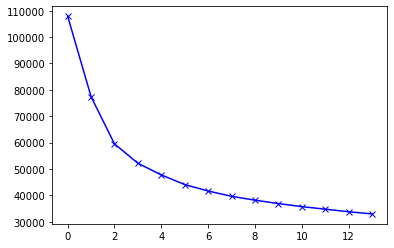

In [88]:
scores = []

for i in range(1,15):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(CPVi_scaled)
    scores.append(kmeans.inertia_)
    
plt.plot(scores, 'bx-')

In [89]:
kmeans = KMeans(3)
kmeans.fit(CPVi_scaled)
labels = kmeans.labels_

In [90]:
kmeans.cluster_centers_.shape

(3, 14)

In [128]:
CPVi_scaled_df = pd.DataFrame(CPVi_scaled, columns=['CPV Nokia',
       'CPV Nokia Experience', 'CPV Nokia Expectation', 'CPV Competitor',
       'CPV Competitor Experience', 'CPV Competitor Expectation',
       'Value perception Nokia', 'Overall satisfaction Nokia',
       'Strategic fit with Nokia', 'Recommendation Nokia',
       'Value perception competitor', 'Overall satisfaction competitor',
       'Strategic fit with competitor', 'Recommendation competitor'])

In [129]:
cluster_centers = pd.DataFrame(data = kmeans.cluster_centers_, columns = [CPVi_scaled_df.columns])
cluster_centers

,CPV Nokia,CPV Nokia Experience,CPV Nokia Expectation,CPV Competitor,CPV Competitor Experience,CPV Competitor Expectation,Value perception Nokia,Overall satisfaction Nokia,Strategic fit with Nokia,Recommendation Nokia,Value perception competitor,Overall satisfaction competitor,Strategic fit with competitor,Recommendation competitor
0,0.632768,0.589425,0.595763,0.692053,0.634992,0.643363,0.536008,0.540216,0.498009,0.547375,0.604198,0.611598,0.523370,0.619367
1,0.393202,0.351851,0.382982,-1.184046,-1.096925,-1.091293,0.274967,0.326959,0.301209,0.345673,-0.897465,-0.954756,-0.887253,-0.911590
2,-1.107835,-1.021049,-1.052706,0.008794,0.016013,0.001032,-0.894493,-0.939195,-0.865661,-0.962515,-0.095356,-0.061517,0.000458,-0.104107


In [130]:
cluster_centers = scaler.inverse_transform(cluster_centers)
cluster_centers = pd.DataFrame(data = cluster_centers, columns = [CPVi_scaled_df.columns])
cluster_centers

,CPV Nokia,CPV Nokia Experience,CPV Nokia Expectation,CPV Competitor,CPV Competitor Experience,CPV Competitor Expectation,Value perception Nokia,Overall satisfaction Nokia,Strategic fit with Nokia,Recommendation Nokia,Value perception competitor,Overall satisfaction competitor,Strategic fit with competitor,Recommendation competitor
0,0.632768,0.589425,0.595763,0.692053,0.634992,0.643363,0.536008,0.540216,0.498009,0.547375,0.604198,0.611598,0.523370,0.619367
1,0.393202,0.351851,0.382982,-1.184046,-1.096925,-1.091293,0.274967,0.326959,0.301209,0.345673,-0.897465,-0.954756,-0.887253,-0.911590
2,-1.107835,-1.021049,-1.052706,0.008794,0.016013,0.001032,-0.894493,-0.939195,-0.865661,-0.962515,-0.095356,-0.061517,0.000458,-0.104107


In [100]:
labels.shape # Labels associated to each data point

(7708,)

In [101]:
labels.max()

2

In [102]:
labels.min()

0

In [103]:
y_kmeans = kmeans.fit_predict(CPVi_scaled)
y_kmeans

array([2, 2, 2, ..., 1, 0, 1])

In [104]:
# concatenate the clusters labels to our original dataframe
CPVi_cluster = pd.concat([CPVi[['CPV Nokia','CPV Nokia Experience', 'CPV Nokia Expectation', 'CPV Competitor',
       'CPV Competitor Experience', 'CPV Competitor Expectation','Value perception Nokia', 'Overall satisfaction Nokia',
       'Strategic fit with Nokia', 'Recommendation Nokia','Value perception competitor', 'Overall satisfaction competitor',
       'Strategic fit with competitor', 'Recommendation competitor']], pd.DataFrame({'cluster':labels})], axis = 1)
CPVi_cluster

,CPV Nokia,CPV Nokia Experience,CPV Nokia Expectation,CPV Competitor,CPV Competitor Experience,CPV Competitor Expectation,Value perception Nokia,Overall satisfaction Nokia,Strategic fit with Nokia,Recommendation Nokia,Value perception competitor,Overall satisfaction competitor,Strategic fit with competitor,Recommendation competitor,cluster
0,0.0049,0.0009,0.0089,0.2141,0.1401,0.2882,0.222222,0.333333,0.333333,0.0,0.555556,0.555556,0.666667,0.555556,1
1,0.0000,0.0000,0.0000,0.8086,0.6866,0.9305,0.111111,0.111111,0.000000,0.0,0.777778,0.777778,0.777778,0.888889,1
2,0.2693,0.4096,0.1290,0.6661,0.6661,0.6661,0.666667,0.333333,0.444444,0.0,0.666667,0.666667,0.666667,0.666667,1
3,0.0930,0.0973,0.0887,0.8375,0.8375,0.8375,0.333333,0.333333,0.333333,0.0,0.777778,0.777778,0.777778,0.777778,1
4,0.0360,0.0000,0.0721,0.9667,0.9334,1.0000,0.000000,0.333333,0.333333,0.0,0.888889,0.888889,0.888889,1.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7703,1.0000,1.0000,1.0000,0.5922,0.5264,0.6579,0.888889,1.000000,0.777778,1.0,0.888889,0.555556,0.777778,0.777778,0
7704,0.8272,0.6543,1.0000,0.9627,0.9253,1.0000,0.777778,0.777778,0.777778,1.0,0.777778,0.888889,0.888889,1.000000,0
7705,0.8670,0.7341,1.0000,0.2310,0.3060,0.1560,1.000000,0.888889,0.888889,1.0,0.777778,0.777778,0.666667,0.777778,2
7706,0.9780,0.9560,1.0000,0.9780,0.9560,1.0000,0.777778,0.888889,0.888889,1.0,0.777778,0.888889,0.888889,1.000000,0


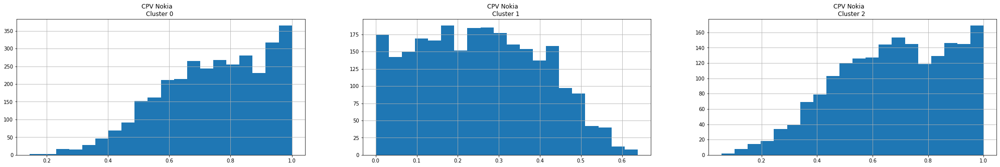

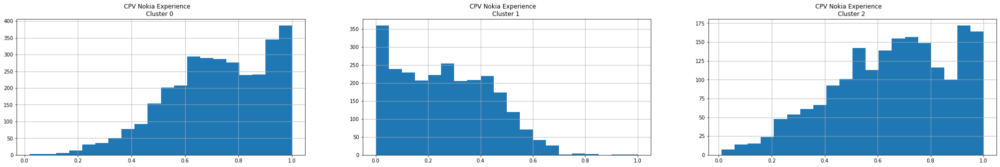

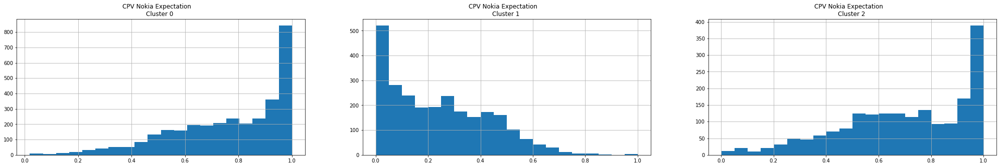

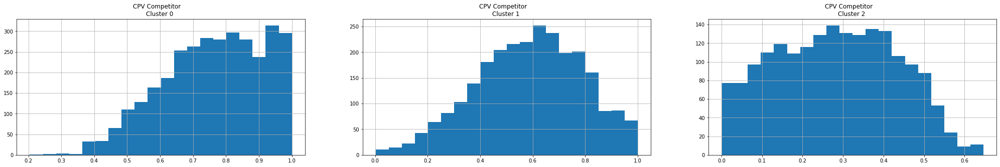

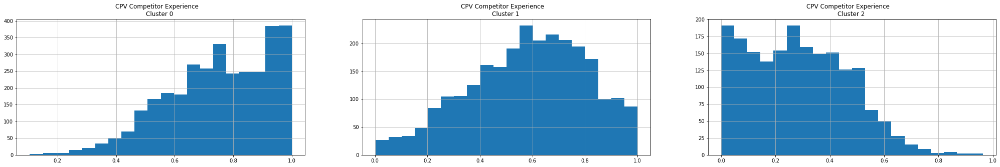

...

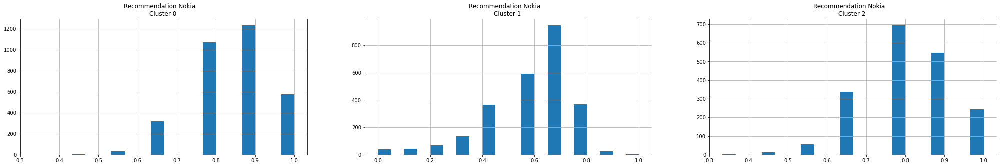

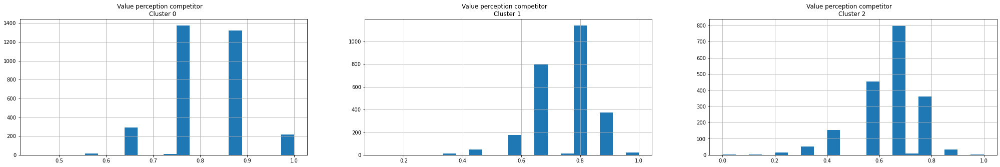

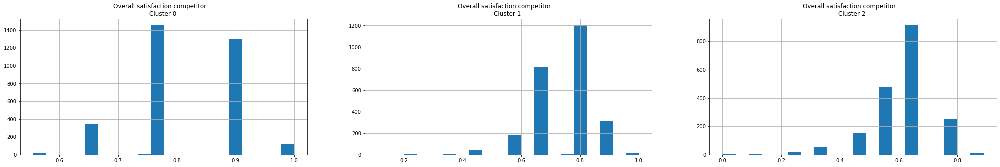

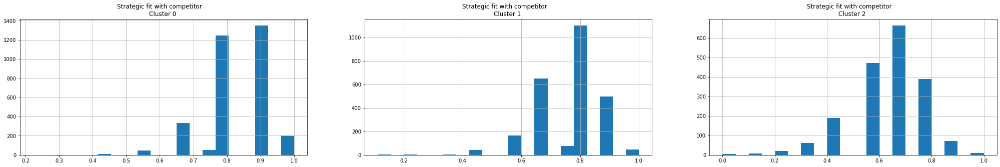

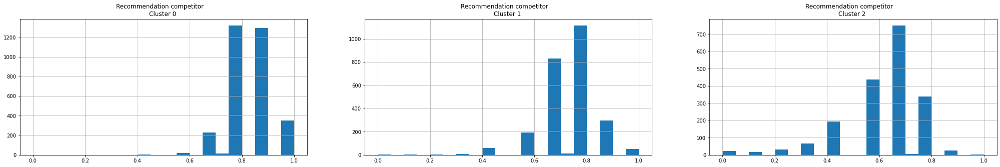

In [105]:
# Plot the histogram of various clusters
for i in CPVi_scaled_df.columns:
  plt.figure(figsize = (35, 5))
  for j in range(3):
    plt.subplot(1,3,j+1)
    cluster = CPVi_cluster[CPVi_cluster['cluster'] == j]
    cluster[i].hist(bins = 20)
    plt.title('{}    \nCluster {} '.format(i,j))
  
  plt.show()

### 12.3 Principal Component Analysis
https://en.wikipedia.org/wiki/Principal_component_analysis

In [106]:
# Obtain the principal components 
pca = PCA(n_components=2)
principal_comp = pca.fit_transform(CPVi_scaled)
principal_comp

array([[ 7.5571671 , -1.61001323],
       [ 5.57621768, -6.52391849],
       [ 3.83695757, -2.47852519],
       ...,
       [-1.58428368,  3.27985448],
       [-4.42600228, -0.60372019],
       [-1.07894842,  3.70409819]])

In [110]:
print('Standard Deviation: '+ str(principal_comp[:, 0].std()) )
print('Mean: '+ str(principal_comp[:, 0].mean()))
print('Min: '+ str(principal_comp.min()))
print('Max: '+ str(principal_comp.max()))

Standard Deviation: 2.4730941239776785
Mean: 0.0
Min: -7.295390922338071
Max: 12.333444685553156


In [111]:
# Create a dataframe with the two components
pca_df = pd.DataFrame(data = principal_comp, columns =['pca1','pca2'])
pca_df.head()

,pca1,pca2
0,7.557167,-1.610013
1,5.576218,-6.523918
2,3.836958,-2.478525
3,3.963869,-5.096078
4,3.454375,-7.295391


In [112]:
# Concatenate the clusters labels to the dataframe
pca_df = pd.concat([pca_df,pd.DataFrame({'cluster':labels})], axis = 1)
pca_df.head()

,pca1,pca2,cluster
0,7.557167,-1.610013,1
1,5.576218,-6.523918,1
2,3.836958,-2.478525,1
3,3.963869,-5.096078,1
4,3.454375,-7.295391,1


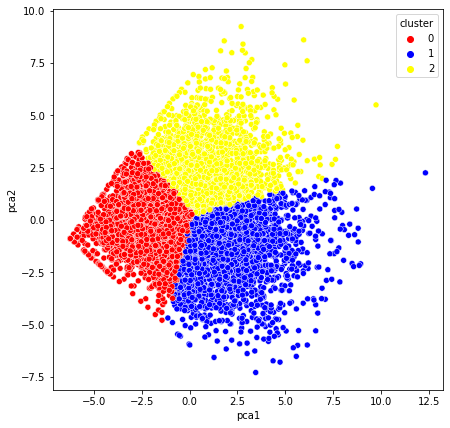

In [113]:
plt.figure(figsize=(7,7))
ax = sns.scatterplot(x="pca1", y="pca2", hue = "cluster", data = pca_df, palette =['red','blue','yellow'])
plt.show()

In [114]:
CPVi_with_cluster = pd.concat([CPVi, CPVi_cluster['cluster']], axis=1, join="inner")
CPVi_with_cluster.sample(5)

,cuseid,Customer,Market,MU/GCBT,CBT,Int. account,Country,Type of interview,Mgt. Level,Persona,Powermap,Working area,Job title,Competitor,CPV Nokia,CPV Nokia Experience,CPV Nokia Expectation,CPV Competitor,CPV Competitor Experience,CPV Competitor Expectation,Value perception Nokia,Overall satisfaction Nokia,Strategic fit with Nokia,Recommendation Nokia,Value perception competitor,Overall satisfaction competitor,Strategic fit with competitor,Recommendation competitor,Published,SAP ID,Interview date,Year,AVG Score Nokia,AVG Score Competitor,cluster
23,84253,Vodafone Ukraine,EUR,EUR EE,EUR EE CBT SIS,n.a.,Ukraine,Face to Face,Level 3,n.a.,Influencer,Technical design & Implementation,Head of Radio Development,Huawei,0.0523,0.0537,0.0510,0.7693,0.7379,0.8006,0.333333,0.333333,0.333333,0.000000,0.666667,0.777778,0.777778,0.777778,2015-12-07,301002892,2017-11-25,2017,0.165286,0.758257,1
509,76615,O2 Czech,EUR,EUR CECA,EUR CECA CBT North,PPF GROUP,Czechia,Phone 2,Level 3,n.a.,Decision Maker,Finance & Procurement,Purchasing Director,Huawei,0.0836,0.0353,0.1320,0.3722,0.3280,0.4165,0.444444,0.444444,0.555556,0.444444,0.666667,0.555556,0.666667,0.666667,2011-03-08,301001300,2020-02-18,2020,0.305684,0.524608,1
3138,78438,3 UK,EUR,EUR UI,EUR UI CBT Hutchison,Hutchison,United Kingdom,Face to Face,Level 2,n.a.,Decision Maker,Company & Product Strategy,COO,Samsung,0.6353,0.9228,0.3478,0.5883,0.8288,0.3478,0.555556,0.888889,0.444444,0.777778,0.777778,0.777778,0.444444,0.777778,2016-05-20,301001018,2017-04-25,2017,0.653224,0.648954,2
5084,78541,CMCC Hainan,GCHN,GCHN CMCC,GCHN CMCC CBT,CMCC,China,Face to Face,Level 3,n.a.,Decision Maker,Finance & Procurement,Head of Procurement Department,Huawei,0.7987,0.7987,0.7987,0.3124,0.3124,0.3124,0.888889,0.888889,0.888889,0.888889,0.777778,0.777778,0.777778,0.777778,2013-05-24,301000058,2018-05-02,2018,0.850237,0.578330,2
4901,98835,CUC HQ,GCHN,GCHN CUC,GCHN CUC CBT,CUC,China,VC,Level 3,COO - VP Fixed Operations,Decision Maker,"Operations, Managed Services & Maintenance",Manager,Huawei,0.2460,0.2460,0.2460,0.6728,0.6728,0.6728,0.777778,0.777778,0.777778,0.777778,0.888889,0.888889,0.888889,0.888889,2021-06-17,301000111,2021-06-02,2021,0.549873,0.796279,0


In [119]:
print(CPVi_with_cluster[['CPV Nokia',
       'CPV Nokia Experience', 'CPV Nokia Expectation', 'CPV Competitor','CPV Competitor Experience', 'CPV Competitor Expectation',
       'Value perception Nokia', 'Overall satisfaction Nokia','Strategic fit with Nokia', 'Recommendation Nokia','Value perception competitor', 'Overall satisfaction competitor',
       'Strategic fit with competitor', 'Recommendation competitor','AVG Score Nokia','AVG Score Competitor', 'cluster']].groupby('cluster').mean().applymap(lambda x: f"{x:0.2f}").transpose())
print('')
print(CPVi_with_cluster['cluster'].value_counts())

cluster                             0     1     2
CPV Nokia                        0.74  0.25  0.68
CPV Nokia Experience             0.72  0.27  0.65
CPV Nokia Expectation            0.77  0.24  0.70
CPV Competitor                   0.76  0.59  0.28
CPV Competitor Experience        0.75  0.58  0.29
CPV Competitor Expectation       0.77  0.59  0.29
Value perception Nokia           0.81  0.60  0.77
Overall satisfaction Nokia       0.81  0.59  0.78
Strategic fit with Nokia         0.79  0.57  0.76
Recommendation Nokia             0.85  0.58  0.81
Value perception competitor      0.83  0.74  0.63
Overall satisfaction competitor  0.82  0.73  0.62
Strategic fit with competitor    0.82  0.75  0.63
Recommendation competitor        0.84  0.73  0.61
AVG Score Nokia                  0.78  0.44  0.74
AVG Score Competitor             0.80  0.67  0.48

0    3234
1    2585
2    1889
Name: cluster, dtype: int64
